In [1]:
import numpy as np
import os
import sys
from pprint import pprint
from numpy import sin, cos, pi
import numpy.matlib
import random
from matplotlib import pyplot as plt
from shapely.geometry import Polygon, Point
import shapely.affinity as affinity
import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU') 
from tensorflow import keras
from tensorflow.keras import layers, regularizers
from sklearn.model_selection import train_test_split
import pyomo.environ as pyo
import pyomo.gdp as pyg
from scipy.spatial import ConvexHull
from numpy import genfromtxt
import pickle

#tf.disable_v2_behavior()  # this line is added to allow placeholder() function to work (does not work in tf2)

In [2]:
plt.style.use('default')

#  Generate Data


## Training/Testing Data 

#### Create Data (Affine Transformation)

In [107]:
def reshape_cos_sin(inp):
    row = inp.shape[0]
    col = inp.shape[1]
    x = np.zeros((row,2*col))
    for i in range(row):
        for j in range(col):
            x[i,2*j] = cos(inp[i,j])
            x[i,2*j+1] = sin(inp[i,j])
    return x

In [108]:
my_data1 = genfromtxt('data1.csv', delimiter=',')
my_data2 = genfromtxt('data2.csv', delimiter=',')
my_data3 = genfromtxt('data3.csv', delimiter=',')
my_data4 = genfromtxt('data4.csv', delimiter=',')
my_data5 = genfromtxt('data5.csv', delimiter=',')
my_data6 = genfromtxt('data6.csv', delimiter=',') #data points

In [109]:
#x = np.concatenate((my_data1[1:,2:8],my_data2[1:,2:8],my_data3[1:,2:8],my_data4[1:,2:8]))*np.pi/180
#y = np.concatenate((my_data1[1:,8:],my_data2[1:,8:],my_data3[1:,8:],my_data4[1:,8:]))
x1 = my_data6[0:, 0:6]
y = my_data6[0:, 6:]
x = reshape_cos_sin(x1)
num_pts = x.shape[0]

In [110]:
num_pts

10000

#### Training Mini-Batch Generator

In [111]:
class Batch(object):
    def __init__(self, X_col, Y_col, batch_size_val):
        self.X = X_col
        self.Y = Y_col
        self.size = X_col.shape[0]
        self.train_size = batch_size_val
        self.test_size = self.size - batch_size_val

    def getBatch(self):
        values = range(self.size)
        train_dataset, test_dataset = train_test_split(values, train_size=self.train_size, test_size=self.test_size)
        # indices = np.random.choice(range(self.size), self.batch_size)  # sampling with replacement
        return self.X[train_dataset, :], self.Y[train_dataset, :], self.X[test_dataset, :], self.Y[test_dataset, :]

batch_size = int(0.8 * num_pts)
batch = Batch(x, y, batch_size)

In [112]:
batch_size

8000

# 3-Layer NN

## Build 3-Layer NN Model

Here we setup a 3-layer MLP, with the single hidden layer of ReLU activation and train it with gradient descent optimizer to learn the defined affine transformation from the given data. 
$$
\min_{\mathbf{W}^0,\mathbf{W}^1,\mathbf{W}^2,\mathbf{W}^3,\mathbf{b}^0,\mathbf{b}^1,\mathbf{b}^2,\mathbf{b}^3}~~\frac{1}{2}\sum^{N}_{n=1}|| \mathbf{y}(\mathbf{x}^0_n,\mathbf{W}^0,\mathbf{W}^1,\mathbf{b}^0,\mathbf{b}^1)-\mathbf{t}_n||^2_2
$$
$$
\mathbf{W}^0 \mathbf{x}^0 + \mathbf{b}^0 = \mathbf{h}^0
$$
$$
\mathbf{x}^1 = \mathrm{ReLU} (\mathbf{h}^0)
$$
$$
\mathbf{W}^1 \mathbf{x}^1 + \mathbf{b}^1 = \mathbf{h}^1
$$
$$
\mathbf{x}^2 = \mathrm{ReLU} (\mathbf{h}^1)
$$
$$
\mathbf{W}^2 \mathbf{x}^2 + \mathbf{b}^2 = \mathbf{y}
$$

![NN_original.jpg](NN_original.jpg)


#### Initializing Parameters for MLP Model

In [9]:
num_input = batch.X.shape[1]
num_output = batch.Y.shape[1]
num_hidden_0 = 20
num_hidden_1 = 20
num_hidden_2 = 20
starter_learning_rate = 0.01
regularizer_rate = 0.0001

#Create the 4 layers model
# Define Sequential model with 4 layers
model_orig = keras.Sequential(name="4_layer_NN")
model_orig.add(layers.Dense(num_hidden_0,
                            activation="relu",
                            kernel_regularizer = regularizers.l2(regularizer_rate),
                            bias_regularizer = regularizers.l2(regularizer_rate),
                            input_shape=(num_input,),
                            name="layer0"))
#model_orig.add(layers.Dropout(0.01))
model_orig.add(layers.Dense(num_hidden_1,
                            activation="relu",
                            kernel_regularizer = regularizers.l2(regularizer_rate),
                            bias_regularizer = regularizers.l2(regularizer_rate),
                            name="layer1"))
#model_orig.add(layers.Dropout(0.01))
model_orig.add(layers.Dense(num_hidden_2,
                            activation="relu",
                            kernel_regularizer = regularizers.l2(regularizer_rate),
                            bias_regularizer = regularizers.l2(regularizer_rate),
                            name="layer2"))
model_orig.add(layers.Dense(num_output,
                            kernel_regularizer = regularizers.l2(regularizer_rate),
                            bias_regularizer = regularizers.l2(regularizer_rate), 
                            name="output"))


In [10]:
num_input

12

In [11]:
model_orig.summary()
print(model_orig.layers[0].weights)
print(model_orig.layers[0].kernel)

Model: "4_layer_NN"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
layer0 (Dense)               (None, 20)                260       
_________________________________________________________________
layer1 (Dense)               (None, 20)                420       
_________________________________________________________________
layer2 (Dense)               (None, 20)                420       
_________________________________________________________________
output (Dense)               (None, 4)                 84        
Total params: 1,184
Trainable params: 1,184
Non-trainable params: 0
_________________________________________________________________
[<tf.Variable 'layer0/kernel:0' shape=(12, 20) dtype=float32, numpy=
array([[-0.16281438,  0.10695639, -0.31141484, -0.21006212, -0.32174733,
         0.00878847,  0.19081321, -0.4038549 ,  0.05775738,  0.28166774,
        -0.04636925, -0.37196645, -0.

#### Train the model

In [12]:
# define loss 
loss = keras.losses.MeanSquaredError(name='MSE')
#loss = keras.losses.MeanSquaredLogarithmicError(name='MSLE')
optimizer = keras.optimizers.SGD(learning_rate = starter_learning_rate, name='SGD')
model_orig.compile(optimizer = optimizer,
                   loss = loss,
                   metrics=['accuracy'])
x_train, y_train, x_test, y_test = batch.getBatch()

In [13]:
his = model_orig.fit(x_train, y_train, epochs=10000, use_multiprocessing = True, verbose = 0)
print("Model Accuracy on Test Data Set")
model_orig.evaluate(x_test,  y_test, verbose=2)


Model Accuracy on Test Data Set
63/63 - 0s - loss: 0.0057 - accuracy: 0.9680


[0.0057321712374687195, 0.9679999947547913]

In [14]:
#w0_orig, b0_orig, w1_orig, b1_orig, w2_orig, b2_orig = s.run([weights_0, bias_0, weights_1, bias_1, weights_2, bias_2])
w0_orig = model_orig.layers[0].kernel.numpy()
b0_orig = model_orig.layers[0].bias.numpy()
w1_orig = model_orig.layers[1].kernel.numpy()
b1_orig = model_orig.layers[1].bias.numpy()
w2_orig = model_orig.layers[2].kernel.numpy()
b2_orig = model_orig.layers[2].bias.numpy()
w3_orig = model_orig.layers[3].kernel.numpy()
b3_orig = model_orig.layers[3].bias.numpy()

#### Plot Loss Function

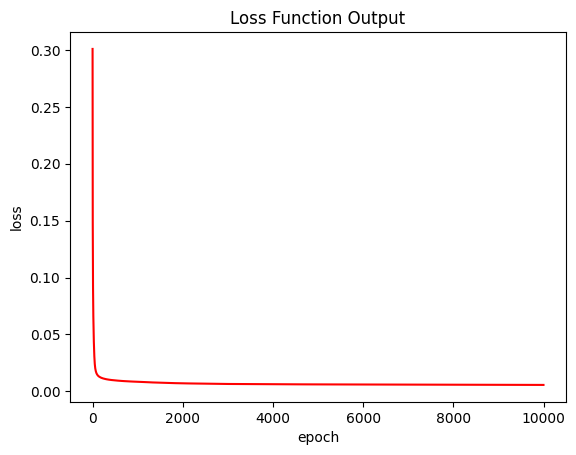

In [15]:
results_train_loss = his.history['loss']
plt.plot(results_train_loss, color='red')
plt.title('Loss Function Output')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [16]:
results_train_loss[10000-1]

0.005606361664831638

#### Plot Trained Model Ouput

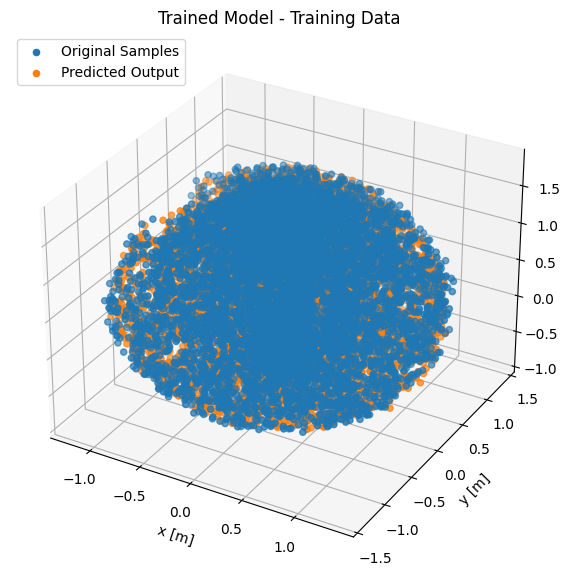

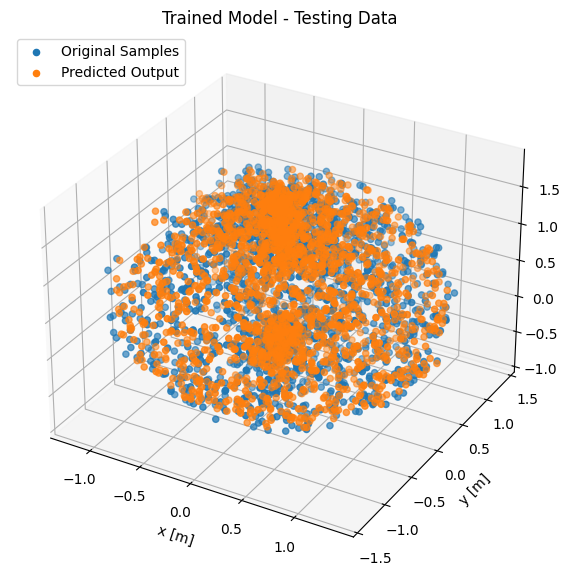

In [25]:
def plot_model(model_orig, x_true, y_true, arg):
    y_predict = model_orig.predict(x_true)
    
    
    fig = plt.figure(figsize = (10, 7))
    ax = plt.axes(projection ="3d")
 
    ## training output
    ax.scatter3D(y_true[:, 0], y_true[:, 1], y_true[:, 2], 'ro', label='Original Samples')

    ## predicted output
    ax.scatter3D(y_predict[:, 0], y_predict[:, 1], y_predict[:, 2], 'ko', label='Predicted Output')
    plt.title(arg)
    plt.xlabel('x [m]')
    plt.ylabel('y [m]')
    plt.legend(loc="upper left")
    
    
    plt.xlim([np.min(y_train[:, 0]), np.max(y_train[:, 0])])
    plt.ylim([np.min(y_train[:, 1]), np.max(y_train[:, 1])])
    plt.savefig('books_read.jpg', dpi=600)
    plt.show()
    
    return y_predict

y_predict_train = plot_model(model_orig, x_train, y_train, arg='Trained Model - Training Data')
y_predict_test = plot_model(model_orig, x_test, y_test, arg='Trained Model - Testing Data')

In [26]:
y_predict_train

array([[ 0.65706694, -0.57998425, -0.03253725,  1.0074458 ],
       [ 0.10891309,  0.94602674,  0.6529091 ,  0.99907887],
       [-0.00354679,  0.01308751,  1.712276  ,  1.0063022 ],
       ...,
       [-0.36638272, -0.7915969 ,  0.24152085,  1.0003924 ],
       [-0.17844151, -0.8807077 ,  0.17887166,  1.0035737 ],
       [ 0.04244645, -1.3690541 ,  0.81773555,  1.00204   ]],
      dtype=float32)

In [27]:
my_data10 = genfromtxt('data10.csv', delimiter=',')

In [28]:
x1_valid = my_data10[0:,0:6]
x_valid = reshape_cos_sin(x1_valid)
y_valid = my_data10[0:,6:]

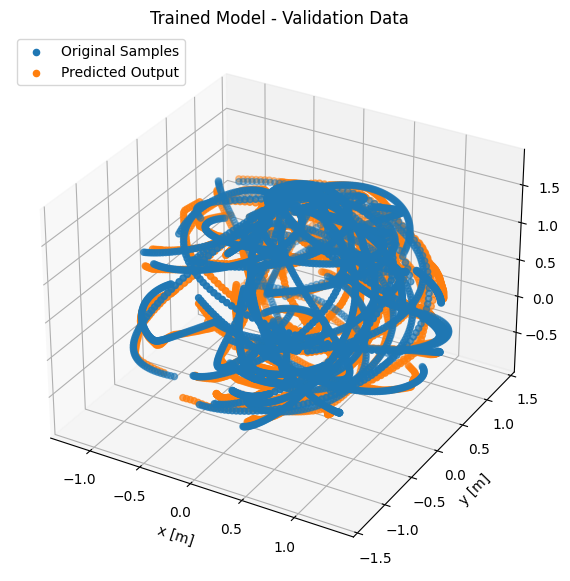

In [29]:
y_predict_valid = plot_model(model_orig, x_valid, y_valid, arg='Trained Model - Validation Data')


### Error Calculator

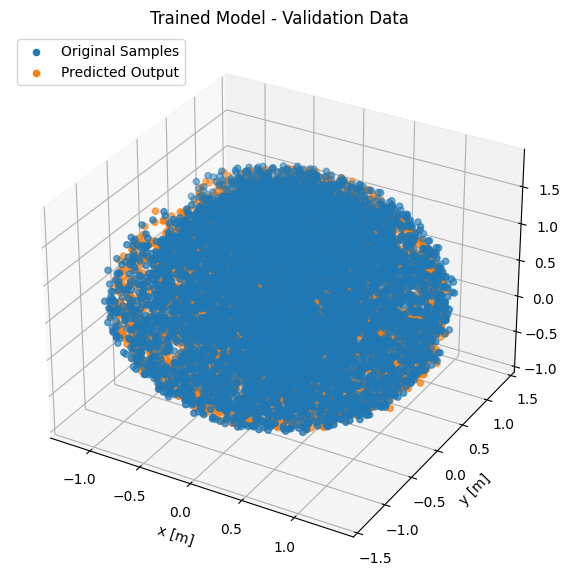

In [30]:
y_valid2 = y
y_predict_valid2 = plot_model(model_orig, x, y, arg='Trained Model - Validation Data')

In [31]:
error = y_predict_valid2-y_valid2

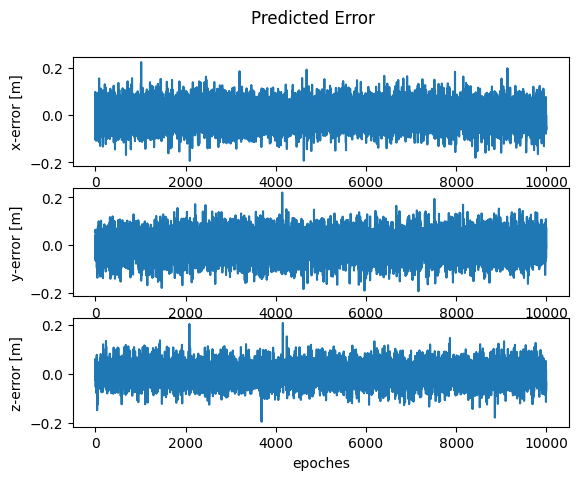

In [32]:
fig, (ax1, ax2, ax3) = plt.subplots(3)
fig.suptitle('Predicted Error')
ax1.plot(error[0:,0])
ax1.set(ylabel = 'x-error [m]')
ax2.plot(error[0:,1])
ax2.set(ylabel = 'y-error [m]')
ax3.plot(error[0:,2])
ax3.set(ylabel = 'z-error [m]',xlabel = 'epoches')
plt.show()

### Repair Data

In [113]:
# separate data inside and outside of the desired bound
x_in_b = np.zeros((1,12))
y_in_b = np.zeros((1,4))
x_out_b = np.zeros((1,12))
y_out_b = np.zeros((1,4))

for i in range(y_predict_valid2.shape[0]):
    if i == 0:
        if y_predict_valid2[i,0]>.5:
            x_out_b = x[i,]
            y_out_b = y[i,]
        else:
            x_in_b = x[i,]
            y_in_b = y[i,]
    else:
        if y_predict_valid2[i,0]>.5:
            x_out_b = np.vstack((x_out_b,x[i,]))
            y_out_b = np.vstack((y_out_b,y[i,]))
        else:
            x_in_b = np.vstack((x_in_b,x[i,]))
            y_in_b = np.vstack((y_in_b,y[i,]))

In [114]:
x_out_b=np.delete(x_out_b, 0, 0)
y_out_b=np.delete(y_out_b, 0, 0)

#### Repair Batch Creator

In [115]:
class Batch_repair(object):
    def __init__(self, X_in_col, Y_in_col, X_out_col, Y_out_col, repair_samp_size, out_in_portion):
        self.X_in = X_in_col
        self.Y_in = Y_in_col
        self.X_out = X_out_col
        self.Y_out = Y_out_col
        self.size = repair_samp_size
        self.in_size = int(repair_samp_size * out_in_portion)
        self.out_size = int(repair_samp_size - self.in_size)

    def getBatch(self):
        values = range(self.size)
        in_dataset, _ = train_test_split(range(self.X_in.shape[0]), train_size=self.in_size, test_size=self.in_size)
        out_dataset, _ = train_test_split(range(self.X_out.shape[0]), train_size=self.out_size, test_size=self.out_size)
        # indices = np.random.choice(range(self.size), self.batch_size)  # sampling with replacement
        return self.X_in[in_dataset, :], self.Y_in[in_dataset, :], self.X_out[out_dataset, :], self.Y_out[out_dataset, :]
    
repair_samp_size = 4000
out_in_portion = 0.8 
batch_repair = Batch_repair(x_in_b, y_in_b, x_out_b, y_out_b, repair_samp_size, out_in_portion)
#batch_repair.getBatch()

In [116]:
x_in, y_in, x_out, y_out = batch_repair.getBatch()

### Replicate the Original NN

#### Classes (NN with Numpy)

In [257]:
class Dense:
    def __init__(self, nin, nout):
        self.weights = np.random.rand(nin, nout) * 2 - 1
        self.bias = np.random.rand(nout) * 2 - 1
        
    def _relu(self, x):
        return np.maximum(x, 0)
    
    def __call__(self, x, relu=False):
        x = x @ self.weights + self.bias
        if relu:
            x = self._relu(x)
            
        return x

    def set_variables(self, weights=None, bias=None):
        if weights is not None:
            self.weights[:] = weights[:]
            
        if bias is not None:
            self.bias[:] = bias[:]
            
class MLP:
    def __init__(self, nin, uout, uhidden):
        self.num_layer = len(uhidden)+1
        prev = nin
        self.layers = []
        for u in uhidden:
            self.layers.append(Dense(prev, u))
            prev = u
        self.layers.append(Dense(prev, uout))
        
    def __call__(self, x, relu=False):
        
        if self.num_layer == 2:
            x1 = self.layers[0](x, relu=True)
            y = self.layers[1](x1, relu=relu)
            return x1, y
        
        if self.num_layer == 3:
            x1 = self.layers[0](x, relu=True)
            x2 = self.layers[1](x1, relu=True)
            y = self.layers[2](x2, relu=relu)
            return x1, x2, y
        if self.num_layer == 4:
            x1 = self.layers[0](x, relu=True)
            x2 = self.layers[1](x1, relu=True)
            x3 = self.layers[2](x2, relu=True)
            y = self.layers[3](x3, relu=relu)
            return x1, x2, x3, y

#### Reconstruct the Original NN to Obtain Diferrent Layer values given Input x0

In [258]:
#Rounding weights to the fifth decimal place
w0_orig=np.round(w0_orig, 5)   
w1_orig=np.round(w1_orig, 5)  
w2_orig=np.round(w2_orig, 5) 
w3_orig=np.round(w3_orig, 5)

b0_orig=np.round(b0_orig,5)
b1_orig=np.round(b1_orig,5)
b2_orig=np.round(b2_orig,5)
b3_orig=np.round(b3_orig,5)

### Shrink Data

In [259]:
x_train_new = np.vstack((x_in,x_out))
y_train_new = np.vstack((y_in,y_out))

In [260]:

#x_train_new = x_train[0:7000,0:]
#y_train_new = y_train[0:7000,0:]
#x_test_new = x_test[0:7000,0:]
#y_test_new = y_test[0:7000,0:]

In [261]:
num_output

4

In [262]:
mlp_orig = MLP(num_input, num_output, [num_hidden_0, num_hidden_1, num_hidden_2])
mlp_orig.layers[0].weights=w0_orig   
mlp_orig.layers[1].weights=w1_orig  
mlp_orig.layers[2].weights=w2_orig  
mlp_orig.layers[3].weights=w3_orig  
mlp_orig.layers[0].bias=b0_orig
mlp_orig.layers[1].bias=b1_orig
mlp_orig.layers[2].bias=b2_orig
mlp_orig.layers[3].bias=b3_orig

X0_orig_train, X1_orig_train, X2_orig_train, Y_orig_train = mlp_orig(x_train, relu=False)
# print("w0= "+str(w_0))
# print("w1= "+str(w_1))
# print("b0= "+str(b_0))
# print("b1= "+str(b_1))
# print("x_train= "+str(x_train))
# print("hiddel_layer= "+str(h_copy))
# print("y_predicted= "+str(y_copy))


In [264]:
x_train.shape

(8000, 12)

## Repair the network with the modification of the last layer

Repairing last layer $\mathbf{W}_{new}^3 \mathbf{x}^3 + \mathbf{b}_{new}^3 = \mathbf{y}$:

\begin{align}
       & \min_{\mathbf{W}^3,\mathbf{b}^3}
       & & \frac{1}{2}\sum^{N}_{n=1}|| \mathbf{y}(\mathbf{x}^3_n,\mathbf{W}^3,\mathbf{b}^3)-\mathbf{t}_n||^2_2, \\
       & \text{s.t.} & &   \mathbf{W}_{new}^3 \mathbf{x}^3 + \mathbf{b}_{new}^3 = \mathbf{y},\\
       & & & \mathbf{A}\mathbf{y}\leq b.
\end{align}


### Build 1 Layer MIP NN

#### classes

In [265]:
class MIPLayer:
    def __init__(self, model, uin, uout, param_bounds=(-1, 1)):
        model.nlayers = getattr(model, 'nlayers', 0)
        self.uin, self.uout = uin, uout
        
        w_l, b_l = 'w' + str(model.nlayers), 'b' + str(model.nlayers)
        
        setattr(model, w_l, pyo.Var(range(uin), range(uout), domain=pyo.Reals, bounds=param_bounds))
        setattr(model, b_l, pyo.Var(range(uout), domain=pyo.Reals, bounds=param_bounds))
        
        self.w = getattr(model, w_l)
        self.b = getattr(model, b_l)
        
        model.nlayers += 1
        self.model = model
        
    def __call__(self, x, shape, relu=False, output_bounds=(-1e1, 1e1)):
        self.model.lout = getattr(self.model, 'lout', 0) + 1
#         print(self.model.nlayers)
        if relu:
            return self._relu_constraints(x, shape, self.model.lout, output_bounds)
        return self._constraints(x, shape, self.model.lout, output_bounds)
    
    def _relu_constraints(self, x, shape, l, output_bounds=(-1e1, 1e1)):
        m, n = shape
        assert n == self.uin
        
        x_l, s_l, theta_l = 'x'+str(l), 's'+str(l), 'theta'+str(l)
        
        setattr(self.model, x_l, pyo.Var(range(m), range(self.uout), domain=pyo.NonNegativeReals, bounds=output_bounds))
        setattr(self.model, s_l, pyo.Var(range(m), range(self.uout), domain=pyo.NonNegativeReals, bounds=output_bounds))
        setattr(self.model, theta_l, pyo.Var(range(m), range(self.uout), domain=pyo.Binary))
        
        def constraints(model, i, j):
            product = self.b[j]
            for k in range(self.uin):
                product += x[i, k] * self.w[k, j]
            return product == getattr(model, x_l)[i, j] - getattr(model, s_l)[i, j]
        
        setattr(self.model, 'eq_constraint'+str(l),
                pyo.Constraint(range(m), range(self.uout), rule=constraints))
        
        def disjuncts(model, i, j):
            return [(getattr(model, theta_l)[i, j] == 0, getattr(model, x_l)[i, j] <= 0),
                    (getattr(model, theta_l)[i, j] == 1, getattr(model, s_l)[i, j] <= 0)]
        
        setattr(self.model, 'disjunction'+str(l), pyg.Disjunction(range(m), range(self.uout), rule=disjuncts))
        return  getattr(self.model, x_l)
        
    def _constraints(self, x, shape, l, output_bounds=(-1e1, 1e1)):
        m, n = shape
        assert n == self.uin
        
        x_l = 'x'+str(l)
        setattr(self.model, x_l, pyo.Var(range(m), range(self.uout), domain=pyo.Reals, bounds=output_bounds))
        
        def constraints(model, i, j):
            product = self.b[j]
            for k in range(self.uin):
                product += x[i, k] * self.w[k, j]
            return product == getattr(model, x_l)[i, j]

        def constraint_inside0(model, i):
             return(getattr(model, x_l)[i, 0] -0.5 <= 0)
        
       
        setattr(self.model, 'eq_constraint'+str(l),
                pyo.Constraint(range(m), range(self.uout), rule=constraints))
        setattr(self.model, 'keep_inside_constraint0'+str(l),
                 pyo.Constraint(range(m), rule=constraint_inside0))

        
        return getattr(self.model, x_l)

In [266]:
class MIPNNModel:
    def __init__(self, uin, uout, uhidden, param_bounds=(-1, 1)):
        self.model = pyo.ConcreteModel()
        
        self.model.nlayers = 0
        
        self.uin, self.uout = uin, uout
        
        self.layers = []
        prev = uin
        for u in uhidden:
            self.layers.append(MIPLayer(self.model, prev, u, param_bounds))
            prev = u
        self.layers.append(MIPLayer(self.model, prev, uout, param_bounds))
        
    def __call__(self, x, shape, relu=False, output_bounds=(-1e1, 1e1)):
        m, n = shape
        assert n == self.uin
        
        for layer in self.layers[:-1]:
            x = layer(x, (m, layer.uin), relu=True, output_bounds=output_bounds)
        
        layer = self.layers[-1]
        y = layer(x, (m, layer.uin), relu=relu, output_bounds=output_bounds)
        return y

#### Building 1 Layer

In [267]:
num_samples = X2_orig_train.shape[0]
mip_model_layer4 = MIPNNModel(num_hidden_2, num_output, [])
y_ = mip_model_layer4(X2_orig_train, (num_samples, num_hidden_2))
#print(y_train)

model_lay4 = mip_model_layer4.model
#pprint(vars(model_lay3))
#print(mip_model_layer3.model.eq_constraint1[(0,0)])

print(y_)

x1


#### Final Output and Ojbective

In [270]:
def squared_sum(x, y, m, n):
    _squared_sum = 0
    for i in range(m):
        for j in range(n):
            _squared_sum += (x[i, j] - y[i, j]) ** 2
    return _squared_sum

cost_expr = squared_sum(y_, y_train, num_samples, num_output) ## check correctness

# regularization term for weigts
for j in range(num_output):
    cost_expr += regularizer_rate*model_lay4.b0[j]**2
    for i in range(num_hidden_2):
        cost_expr += regularizer_rate*model_lay4.w0[i, j]**2



model_lay4.obj = pyo.Objective(expr=cost_expr)
pyo.TransformationFactory('gdp.bigm').apply_to(model_lay4)
opt = pyo.SolverFactory('gurobi',solver_io="python")

opt.solve(model_lay4, tee=True)

Parameter OutputFlag unchanged
   Value: 1  Min: 0  Max: 1  Default: 1
Changed value of parameter LogFile to C:\Users\kmajd1\AppData\Local\Temp\tmpif42y387.log
   Prev:   Default: 
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (win64)
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads
Optimize a model with 40000 rows, 32084 columns and 450456 nonzeros
Model fingerprint: 0xf8e6a980
Model has 32084 quadratic objective terms
Coefficient statistics:
  Matrix range     [5e-06, 1e+00]
  Objective range  [1e-04, 3e+00]
  QObjective range [2e-04, 2e+00]
  Bounds range     [1e+00, 1e+01]
  RHS range        [5e-01, 5e-01]
Presolve removed 8000 rows and 8 columns
Presolve time: 0.11s
Presolved: 32000 rows, 32076 columns, 442456 nonzeros
Presolved model has 32076 quadratic objective terms
Ordering time: 0.01s

Barrier statistics:
 Dense cols : 72
 AA' NZ     : 4.105e+05
 Factor NZ  : 4.431e+05 (roughly 30 MBytes of memory)
 Factor Ops : 6.178e+06 (less than 1 second per

{'Problem': [{'Name': 'unknown', 'Lower bound': 717.9788958614008, 'Upper bound': 717.9788958614008, 'Number of objectives': 1, 'Number of constraints': 40000, 'Number of variables': 32084, 'Number of binary variables': 0, 'Number of integer variables': 0, 'Number of continuous variables': 32084, 'Number of nonzeros': 450456, 'Sense': 1, 'Number of solutions': 1}], 'Solver': [{'Name': 'Gurobi 9.10', 'Status': 'ok', 'Wallclock time': 0.8981285095214844, 'Termination condition': 'optimal', 'Termination message': 'Model was solved to optimality (subject to tolerances), and an optimal solution is available.'}], 'Solution': [OrderedDict([('number of solutions', 0), ('number of solutions displayed', 0)])]}

In [271]:
# original_stdout = sys.stdout # Save a reference to the original standard output

# with open('last_layer_mip_model.txt', 'w') as f:
#     sys.stdout = f # Change the standard output to the file we created.
#     model_lay4.pprint()
#     sys.stdout = original_stdout # Reset the standard output to its original value

In [272]:
model_lay4.w0.display()

w0 : Size=80, Index=w0_index
    Key     : Lower : Value                   : Upper : Fixed : Stale : Domain
     (0, 0) :    -1 :                    -0.0 :     1 : False : False :  Reals
     (0, 1) :    -1 :                    -0.0 :     1 : False : False :  Reals
     (0, 2) :    -1 :                    -0.0 :     1 : False : False :  Reals
     (0, 3) :    -1 :                    -0.0 :     1 : False : False :  Reals
     (1, 0) :    -1 :     -0.2629790507020694 :     1 : False : False :  Reals
     (1, 1) :    -1 :     -0.8193967830154776 :     1 : False : False :  Reals
     (1, 2) :    -1 :    -0.13630970529477293 :     1 : False : False :  Reals
     (1, 3) :    -1 :  0.00010933242832433798 :     1 : False : False :  Reals
     (2, 0) :    -1 :                    -0.0 :     1 : False : False :  Reals
     (2, 1) :    -1 :                    -0.0 :     1 : False : False :  Reals
     (2, 2) :    -1 :                    -0.0 :     1 : False : False :  Reals
     (2, 3) :    -1 :  

In [273]:
model_lay4.b0.display()

b0 : Size=4, Index=b0_index
    Key : Lower : Value               : Upper : Fixed : Stale : Domain
      0 :    -1 : -0.4978624725731049 :     1 : False : False :  Reals
      1 :    -1 :  0.2503086328969497 :     1 : False : False :  Reals
      2 :    -1 : 0.32673693782843505 :     1 : False : False :  Reals
      3 :    -1 :  0.9989746328611151 :     1 : False : False :  Reals


In [274]:
print(w1_orig) #previously trained nn weights
print(b1_orig) #previously trained nn bias

[[-1.4784e-01  1.4043e-01 -1.3347e-01 -1.3709e-01 -7.6130e-02 -8.4800e-02
   5.0140e-02  7.4360e-02 -2.7511e-01  3.0600e-02 -2.2070e-02 -5.6940e-02
   2.2242e-01  2.9276e-01  3.5200e-02 -2.3370e-02  5.5250e-02 -1.3846e-01
  -1.0177e-01 -3.6518e-01]
 [-4.7110e-02 -1.1520e-02 -4.6940e-02 -2.1839e-01 -1.0701e-01 -8.6860e-02
  -8.7640e-02 -5.7350e-02 -1.7000e-03  8.9510e-02 -4.7210e-02  9.5560e-02
   1.1432e-01  2.7264e-01  2.9250e-02 -7.1970e-02 -6.4320e-02 -5.8010e-02
  -7.9540e-02 -7.5470e-02]
 [ 1.0285e-01 -3.8300e-02 -4.7940e-02 -7.6970e-02 -6.6090e-02 -7.9400e-02
  -1.6807e-01 -1.9444e-01  1.4167e-01  1.8678e-01  1.0738e-01  1.5587e-01
  -1.1475e-01  2.1741e-01  5.6550e-02 -2.9910e-02  2.6053e-01  1.6148e-01
  -9.3380e-02  2.1538e-01]
 [-1.2121e-01 -1.9662e-01  9.9540e-02 -2.2340e-02  2.0664e-01 -2.0302e-01
  -1.1535e-01 -1.1821e-01  9.7900e-02 -4.0830e-02  1.5120e-02 -1.6490e-02
  -9.9380e-02 -7.8110e-02 -2.0530e-02  1.7909e-01  2.9024e-01  3.6308e-01
   1.6671e-01  9.2110e-02]
 [-1

In [275]:
model_lay4.x1.display()

x1 : Size=32000, Index=x1_index
    Key       : Lower : Value                   : Upper : Fixed : Stale : Domain
       (0, 0) : -10.0 :     0.30621232733270176 :  10.0 : False : False :  Reals
       (0, 1) : -10.0 :      -0.583446375775388 :  10.0 : False : False :  Reals
       (0, 2) : -10.0 :   -0.031847537276377125 :  10.0 : False : False :  Reals
       (0, 3) : -10.0 :      1.0000062300636756 :  10.0 : False : False :  Reals
       (1, 0) : -10.0 :     0.03690200064744431 :  10.0 : False : False :  Reals
       (1, 1) : -10.0 :      0.9560195603922939 :  10.0 : False : False :  Reals
       (1, 2) : -10.0 :       0.650495112165066 :  10.0 : False : False :  Reals
       (1, 3) : -10.0 :      0.9999889608785892 :  10.0 : False : False :  Reals
       (2, 0) : -10.0 :    -0.04303912175493352 :  10.0 : False : False :  Reals
       (2, 1) : -10.0 :    0.014247957027620828 :  10.0 : False : False :  Reals
       (2, 2) : -10.0 :       1.715987198001315 :  10.0 : False : False :  Re

     (440, 3) : -10.0 :       1.000010693238874 :  10.0 : False : False :  Reals
     (441, 0) : -10.0 :     -0.5442548501460891 :  10.0 : False : False :  Reals
     (441, 1) : -10.0 :     -0.8164531726703323 :  10.0 : False : False :  Reals
     (441, 2) : -10.0 :    -0.36207271387093165 :  10.0 : False : False :  Reals
     (441, 3) : -10.0 :      0.9999981271053713 :  10.0 : False : False :  Reals
     (442, 0) : -10.0 :     0.36472282382543497 :  10.0 : False : False :  Reals
     (442, 1) : -10.0 :     -0.7005854670575253 :  10.0 : False : False :  Reals
     (442, 2) : -10.0 :     0.47521711950354195 :  10.0 : False : False :  Reals
     (442, 3) : -10.0 :       1.000007169517021 :  10.0 : False : False :  Reals
     (443, 0) : -10.0 :     0.17797308642004772 :  10.0 : False : False :  Reals
     (443, 1) : -10.0 :     -0.6054423919638161 :  10.0 : False : False :  Reals
     (443, 2) : -10.0 :      1.1415064656347038 :  10.0 : False : False :  Reals
     (443, 3) : -10.0 :     

    (1047, 3) : -10.0 :      0.9999823431219497 :  10.0 : False : False :  Reals
    (1048, 0) : -10.0 :    0.024413922755890383 :  10.0 : False : False :  Reals
    (1048, 1) : -10.0 :     -0.3757395666148273 :  10.0 : False : False :  Reals
    (1048, 2) : -10.0 :    -0.39190278579003746 :  10.0 : False : False :  Reals
    (1048, 3) : -10.0 :      1.0000096275216634 :  10.0 : False : False :  Reals
    (1049, 0) : -10.0 :    -0.08990432123910175 :  10.0 : False : False :  Reals
    (1049, 1) : -10.0 :    -0.04114905293676152 :  10.0 : False : False :  Reals
    (1049, 2) : -10.0 :      1.6926653375063943 :  10.0 : False : False :  Reals
    (1049, 3) : -10.0 :      1.0000151228522096 :  10.0 : False : False :  Reals
    (1050, 0) : -10.0 :     0.17583073014367834 :  10.0 : False : False :  Reals
    (1050, 1) : -10.0 :     -1.1522252194228546 :  10.0 : False : False :  Reals
    (1050, 2) : -10.0 :      0.5061595020875753 :  10.0 : False : False :  Reals
    (1050, 3) : -10.0 :     

    (1667, 0) : -10.0 :     0.21832850244267554 :  10.0 : False : False :  Reals
    (1667, 1) : -10.0 :      0.9778495198444013 :  10.0 : False : False :  Reals
    (1667, 2) : -10.0 :     -0.2007858065289181 :  10.0 : False : False :  Reals
    (1667, 3) : -10.0 :      0.9999920113744736 :  10.0 : False : False :  Reals
    (1668, 0) : -10.0 :     0.16558318328170074 :  10.0 : False : False :  Reals
    (1668, 1) : -10.0 :    -0.06896515650231905 :  10.0 : False : False :  Reals
    (1668, 2) : -10.0 :    -0.17082547190752173 :  10.0 : False : False :  Reals
    (1668, 3) : -10.0 :      1.0000225596957684 :  10.0 : False : False :  Reals
    (1669, 0) : -10.0 :    -0.21073461560105322 :  10.0 : False : False :  Reals
    (1669, 1) : -10.0 :     0.09991463405572709 :  10.0 : False : False :  Reals
    (1669, 2) : -10.0 :    0.058029191365257304 :  10.0 : False : False :  Reals
    (1669, 3) : -10.0 :      0.9999615160941175 :  10.0 : False : False :  Reals
    (1670, 0) : -10.0 :     

    (2277, 0) : -10.0 :    -0.09994476440745714 :  10.0 : False : False :  Reals
    (2277, 1) : -10.0 :    -0.49599276261347924 :  10.0 : False : False :  Reals
    (2277, 2) : -10.0 :      1.5198466804298096 :  10.0 : False : False :  Reals
    (2277, 3) : -10.0 :      1.0000188571912503 :  10.0 : False : False :  Reals
    (2278, 0) : -10.0 :    -0.34628624533392305 :  10.0 : False : False :  Reals
    (2278, 1) : -10.0 :    -0.41515159775775423 :  10.0 : False : False :  Reals
    (2278, 2) : -10.0 :     -0.6094074739383668 :  10.0 : False : False :  Reals
    (2278, 3) : -10.0 :      0.9999864355568615 :  10.0 : False : False :  Reals
    (2279, 0) : -10.0 :     0.06524511127819821 :  10.0 : False : False :  Reals
    (2279, 1) : -10.0 :     -0.2332193138704639 :  10.0 : False : False :  Reals
    (2279, 2) : -10.0 :      1.6473939277711054 :  10.0 : False : False :  Reals
    (2279, 3) : -10.0 :      1.0000127531205507 :  10.0 : False : False :  Reals
    (2280, 0) : -10.0 :     

    (2887, 0) : -10.0 :      0.3467608721775637 :  10.0 : False : False :  Reals
    (2887, 1) : -10.0 :     -0.6244499212548078 :  10.0 : False : False :  Reals
    (2887, 2) : -10.0 :    -0.35857497543427286 :  10.0 : False : False :  Reals
    (2887, 3) : -10.0 :      0.9999792473742417 :  10.0 : False : False :  Reals
    (2888, 0) : -10.0 :     -0.1622640552711747 :  10.0 : False : False :  Reals
    (2888, 1) : -10.0 :      0.6974236567430125 :  10.0 : False : False :  Reals
    (2888, 2) : -10.0 :     -0.7295120241397033 :  10.0 : False : False :  Reals
    (2888, 3) : -10.0 :      1.0000243197120255 :  10.0 : False : False :  Reals
    (2889, 0) : -10.0 :       0.227116424807841 :  10.0 : False : False :  Reals
    (2889, 1) : -10.0 :     0.26795099226307606 :  10.0 : False : False :  Reals
    (2889, 2) : -10.0 :      1.4228107318813397 :  10.0 : False : False :  Reals
    (2889, 3) : -10.0 :      0.9999941091005429 :  10.0 : False : False :  Reals
    (2890, 0) : -10.0 :     

    (3491, 2) : -10.0 :      1.2097064039657681 :  10.0 : False : False :  Reals
    (3491, 3) : -10.0 :      0.9999535378583531 :  10.0 : False : False :  Reals
    (3492, 0) : -10.0 :      0.3715625403516789 :  10.0 : False : False :  Reals
    (3492, 1) : -10.0 :    -0.17755186030512426 :  10.0 : False : False :  Reals
    (3492, 2) : -10.0 :     -0.1162420312441288 :  10.0 : False : False :  Reals
    (3492, 3) : -10.0 :      1.0000115105710066 :  10.0 : False : False :  Reals
    (3493, 0) : -10.0 :      0.2242242351143542 :  10.0 : False : False :  Reals
    (3493, 1) : -10.0 :      0.7103071665529779 :  10.0 : False : False :  Reals
    (3493, 2) : -10.0 :      0.7274368632425574 :  10.0 : False : False :  Reals
    (3493, 3) : -10.0 :      0.9999944738718991 :  10.0 : False : False :  Reals
    (3494, 0) : -10.0 :    -0.07370997430699155 :  10.0 : False : False :  Reals
    (3494, 1) : -10.0 :     -0.9445902924197291 :  10.0 : False : False :  Reals
    (3494, 2) : -10.0 :    -

    (4198, 3) : -10.0 :      0.9999854916793698 :  10.0 : False : False :  Reals
    (4199, 0) : -10.0 :    0.042911162743633824 :  10.0 : False : False :  Reals
    (4199, 1) : -10.0 :    -0.46715230818108644 :  10.0 : False : False :  Reals
    (4199, 2) : -10.0 :      1.6893806859446467 :  10.0 : False : False :  Reals
    (4199, 3) : -10.0 :      1.0000160277450814 :  10.0 : False : False :  Reals
    (4200, 0) : -10.0 :     -0.5125084236985487 :  10.0 : False : False :  Reals
    (4200, 1) : -10.0 :      1.3462640138216369 :  10.0 : False : False :  Reals
    (4200, 2) : -10.0 :     0.04020442801150281 :  10.0 : False : False :  Reals
    (4200, 3) : -10.0 :      0.9999744545188491 :  10.0 : False : False :  Reals
    (4201, 0) : -10.0 :    -0.13011890475076981 :  10.0 : False : False :  Reals
    (4201, 1) : -10.0 :     -0.7232890514496653 :  10.0 : False : False :  Reals
    (4201, 2) : -10.0 :      1.3786157571300883 :  10.0 : False : False :  Reals
    (4201, 3) : -10.0 :     

    (4833, 2) : -10.0 :      0.2600091738524668 :  10.0 : False : False :  Reals
    (4833, 3) : -10.0 :      0.9999990694948053 :  10.0 : False : False :  Reals
    (4834, 0) : -10.0 :      0.3263593702127956 :  10.0 : False : False :  Reals
    (4834, 1) : -10.0 :      0.7910833012885661 :  10.0 : False : False :  Reals
    (4834, 2) : -10.0 :    -0.09446009010238043 :  10.0 : False : False :  Reals
    (4834, 3) : -10.0 :      0.9999822475089477 :  10.0 : False : False :  Reals
    (4835, 0) : -10.0 :     0.14790073197173292 :  10.0 : False : False :  Reals
    (4835, 1) : -10.0 :     -0.8655698765154725 :  10.0 : False : False :  Reals
    (4835, 2) : -10.0 :      0.9100937038672612 :  10.0 : False : False :  Reals
    (4835, 3) : -10.0 :      0.9999967083442858 :  10.0 : False : False :  Reals
    (4836, 0) : -10.0 :     0.10310836448274507 :  10.0 : False : False :  Reals
    (4836, 1) : -10.0 :   -0.006694941459501891 :  10.0 : False : False :  Reals
    (4836, 2) : -10.0 :     

    (5432, 2) : -10.0 :      1.2261699202980463 :  10.0 : False : False :  Reals
    (5432, 3) : -10.0 :      0.9999952794044802 :  10.0 : False : False :  Reals
    (5433, 0) : -10.0 :      -0.255830110467846 :  10.0 : False : False :  Reals
    (5433, 1) : -10.0 :      0.8288319388375829 :  10.0 : False : False :  Reals
    (5433, 2) : -10.0 :      1.0759481621233746 :  10.0 : False : False :  Reals
    (5433, 3) : -10.0 :      1.0000016599853652 :  10.0 : False : False :  Reals
    (5434, 0) : -10.0 :     0.04435851931413204 :  10.0 : False : False :  Reals
    (5434, 1) : -10.0 :    -0.07020232858669395 :  10.0 : False : False :  Reals
    (5434, 2) : -10.0 :      1.0163540438478211 :  10.0 : False : False :  Reals
    (5434, 3) : -10.0 :      1.0000042278418189 :  10.0 : False : False :  Reals
    (5435, 0) : -10.0 :      0.3614516003497368 :  10.0 : False : False :  Reals
    (5435, 1) : -10.0 :     -0.4528025890321672 :  10.0 : False : False :  Reals
    (5435, 2) : -10.0 :     

    (6102, 2) : -10.0 :      1.3322331382550736 :  10.0 : False : False :  Reals
    (6102, 3) : -10.0 :      1.0000234506468182 :  10.0 : False : False :  Reals
    (6103, 0) : -10.0 :     0.00901747220131277 :  10.0 : False : False :  Reals
    (6103, 1) : -10.0 :     -0.2972740079003202 :  10.0 : False : False :  Reals
    (6103, 2) : -10.0 :      0.9700318478688228 :  10.0 : False : False :  Reals
    (6103, 3) : -10.0 :      0.9999725551528034 :  10.0 : False : False :  Reals
    (6104, 0) : -10.0 :       0.290138341318265 :  10.0 : False : False :  Reals
    (6104, 1) : -10.0 :      -0.576454635658644 :  10.0 : False : False :  Reals
    (6104, 2) : -10.0 :     -0.2596950565394245 :  10.0 : False : False :  Reals
    (6104, 3) : -10.0 :      0.9999891263687068 :  10.0 : False : False :  Reals
    (6105, 0) : -10.0 :     0.13751819992024572 :  10.0 : False : False :  Reals
    (6105, 1) : -10.0 :     -0.5094906637328354 :  10.0 : False : False :  Reals
    (6105, 2) : -10.0 :     

    (6651, 0) : -10.0 :     -0.5008251639924275 :  10.0 : False : False :  Reals
    (6651, 1) : -10.0 :      1.1284453096862652 :  10.0 : False : False :  Reals
    (6651, 2) : -10.0 :      0.7362899873235786 :  10.0 : False : False :  Reals
    (6651, 3) : -10.0 :      0.9999960276376267 :  10.0 : False : False :  Reals
    (6652, 0) : -10.0 :     0.34639241540559595 :  10.0 : False : False :  Reals
    (6652, 1) : -10.0 :    -0.49768673441009703 :  10.0 : False : False :  Reals
    (6652, 2) : -10.0 :      0.8597889387574078 :  10.0 : False : False :  Reals
    (6652, 3) : -10.0 :      0.9999711707403502 :  10.0 : False : False :  Reals
    (6653, 0) : -10.0 :    -0.07360990152879054 :  10.0 : False : False :  Reals
    (6653, 1) : -10.0 :      0.7095373484465721 :  10.0 : False : False :  Reals
    (6653, 2) : -10.0 :       0.978558194958552 :  10.0 : False : False :  Reals
    (6653, 3) : -10.0 :      0.9999977288013397 :  10.0 : False : False :  Reals
    (6654, 0) : -10.0 :   0.

    (7261, 3) : -10.0 :      0.9999840470210177 :  10.0 : False : False :  Reals
    (7262, 0) : -10.0 :     0.09402131612021769 :  10.0 : False : False :  Reals
    (7262, 1) : -10.0 :     -0.6199710371694724 :  10.0 : False : False :  Reals
    (7262, 2) : -10.0 :       1.130843052833633 :  10.0 : False : False :  Reals
    (7262, 3) : -10.0 :      1.0000045918107432 :  10.0 : False : False :  Reals
    (7263, 0) : -10.0 :      0.1400144830038883 :  10.0 : False : False :  Reals
    (7263, 1) : -10.0 :     0.05841265808878582 :  10.0 : False : False :  Reals
    (7263, 2) : -10.0 :      1.4271514386053443 :  10.0 : False : False :  Reals
    (7263, 3) : -10.0 :        1.00001669067667 :  10.0 : False : False :  Reals
    (7264, 0) : -10.0 :     0.10278306501273526 :  10.0 : False : False :  Reals
    (7264, 1) : -10.0 :      0.2793800071070809 :  10.0 : False : False :  Reals
    (7264, 2) : -10.0 :      1.6378103210097663 :  10.0 : False : False :  Reals
    (7264, 3) : -10.0 :     

    (7914, 1) : -10.0 :     -0.6164548539264487 :  10.0 : False : False :  Reals
    (7914, 2) : -10.0 :      1.4333803810914176 :  10.0 : False : False :  Reals
    (7914, 3) : -10.0 :      0.9999982829370531 :  10.0 : False : False :  Reals
    (7915, 0) : -10.0 :     -0.3140248435776236 :  10.0 : False : False :  Reals
    (7915, 1) : -10.0 :     0.17534770253062604 :  10.0 : False : False :  Reals
    (7915, 2) : -10.0 :      1.7023520874413105 :  10.0 : False : False :  Reals
    (7915, 3) : -10.0 :      1.0000144628031755 :  10.0 : False : False :  Reals
    (7916, 0) : -10.0 :      0.3226282284719577 :  10.0 : False : False :  Reals
    (7916, 1) : -10.0 :      0.7697418879283404 :  10.0 : False : False :  Reals
    (7916, 2) : -10.0 :     0.38740106691191833 :  10.0 : False : False :  Reals
    (7916, 3) : -10.0 :       0.999998341545778 :  10.0 : False : False :  Reals
    (7917, 0) : -10.0 :    -0.01987218083640485 :  10.0 : False : False :  Reals
    (7917, 1) : -10.0 :     

In [276]:
print(Y_orig_train)

[[ 0.65708267 -0.58000534 -0.03254414  1.00744405]
 [ 0.10891444  0.94599617  0.65292399  0.99906863]
 [-0.00352613  0.01305309  1.71228234  1.00629797]
 ...
 [-0.36635572 -0.79160683  0.24150269  1.00039181]
 [-0.17841943 -0.88072382  0.17885248  1.00357333]
 [ 0.042479   -1.36906006  0.81773695  1.00204036]]


In [277]:
y_new = np.zeros((num_samples, num_output))
w3_new = np.zeros((num_hidden_2, num_output))
b3_new = np.zeros((num_output))
for i in range(num_samples):
    for j in range(num_output):
        y_new[i, j] = model_lay4.x1[i, j].value
for j in range(num_output):
    b3_new[j] = model_lay4.b0[j].value
    for i in range(num_hidden_2):
        w3_new[i, j] = model_lay4.w0[i, j].value
print(w3_new)
print(b3_new)


[[-0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00]
 [-2.62979051e-01 -8.19396783e-01 -1.36309705e-01  1.09332428e-04]
 [-0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00]
 [-6.66215742e-01  9.13164559e-02 -8.19690657e-02 -7.18282211e-05]
 [-8.00735248e-01 -2.24301351e-01  4.04496250e-01 -4.75706707e-04]
 [ 1.04230754e-01 -5.19295422e-01  9.99998681e-01  9.80680609e-04]
 [ 2.79527317e-01  8.85654511e-01  1.60212319e-01  1.41730426e-04]
 [ 7.89512525e-01 -3.99757881e-01 -9.99988964e-01  7.56565893e-04]
 [ 9.86339473e-01 -2.78279869e-01  3.23888619e-02 -6.20036148e-04]
 [-9.80307845e-01 -6.66823039e-02 -4.25222898e-03  6.16046455e-06]
 [ 1.00000000e+00  6.23540861e-03  3.17934391e-01  4.16766874e-04]
 [ 3.08800735e-01 -6.99502959e-01  5.78152004e-02 -1.34863777e-04]
 [-1.68346974e-01  3.16828806e-01  2.02548353e-01  2.07722722e-03]
 [-2.48838736e-02  2.51631898e-02  4.88519834e-02  7.69157853e-07]
 [-5.82232578e-01 -5.21005511e-01 -2.49782288e-01  1.27346599e

#### Build Refined NN 

In [278]:
mlp_lay4 = MLP(num_input, num_output, [num_hidden_0, num_hidden_1, num_hidden_2])
mlp_lay4.layers[0].weights=w0_orig   
mlp_lay4.layers[1].weights=w1_orig  
mlp_lay4.layers[2].weights=w2_orig  
mlp_lay4.layers[3].weights=w3_new  
mlp_lay4.layers[0].bias=b0_orig
mlp_lay4.layers[1].bias=b1_orig
mlp_lay4.layers[2].bias=b2_orig
mlp_lay4.layers[3].bias=b3_new

X0_new4_train, X1_new4_train, X2_new4_train, y_new4_train = mlp_lay4(x_train, relu=False)

#### Plot New Results

In [279]:
y_new4_train.shape

(8000, 4)

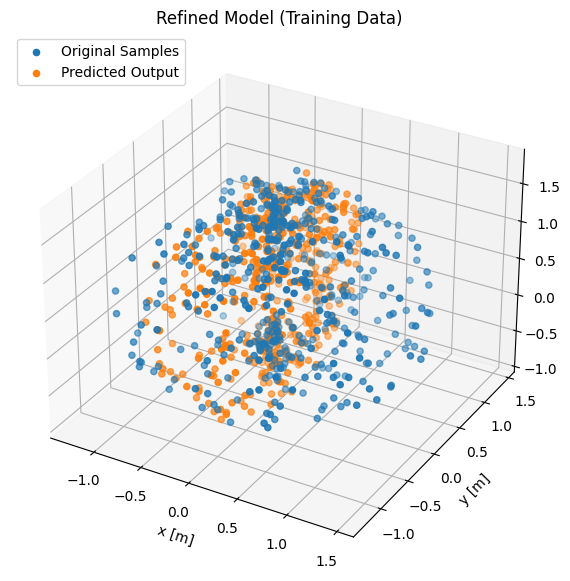

In [280]:
fig = plt.figure(figsize = (10, 7))
ax = plt.axes(projection ="3d")
 
## training output
ax.scatter3D(Y_orig_train[0:500, 0], Y_orig_train[0:500, 1], Y_orig_train[0:500, 2], 'ro', label='Original Samples')

## predicted output
ax.scatter3D(y_new4_train[0:500, 0], y_new4_train[0:500, 1], y_new4_train[0:500, 2], 'ko', label='Predicted Output')
plt.title('Refined Model (Training Data)')
plt.xlabel('x [m]')
plt.ylabel('y [m]')
plt.legend(loc="upper left")
    
plt.show()

In [281]:
import pickle 

with open('model_refined/y_train_original.data', 'wb') as filehandle:
    # store the data as binary data stream
    pickle.dump(y_train, filehandle)
    
with open('model_refined/y_new_last_layer.data', 'wb') as filehandle:
    # store the data as binary data stream
    pickle.dump(y_new4_train, filehandle)

## Repair the network with the modification of the third layer

### Replicate the Original NN

#### Classes (NN with Numpy)

In [282]:
X1 = X1_new4_train
X2 = X2_new4_train

num_samples = X1.shape[0]

model_lay3 = pyo.ConcreteModel()
model_lay3.w0 = pyo.Var(range(num_hidden_1), range(num_hidden_2), domain=pyo.Reals, bounds=(-10,10))
model_lay3.b0 = pyo.Var(range(num_hidden_2), domain=pyo.Reals, bounds=(-10,10))
model_lay3.x3 = pyo.Var(range(num_samples), range(num_output), domain=pyo.Reals, bounds=(-10,10))

model_lay3.eq_constraint_0 = pyo.ConstraintList()
model_lay3.ineq_constraint_0 = pyo.ConstraintList()
model_lay3.eq_constraint_1 = pyo.ConstraintList()

for n in range(num_samples):
    
    ## third layer constraints
    for i in range(num_hidden_2):
        
        # form the constraint
        product = model_lay3.b0[i]
        for r in range(num_hidden_1):
            product += np.round(X1[n, r], 4) * model_lay3.w0[r, i]
        
        # if this node is activated
        if X2[n,i] > 0:   
            
            # define variable for this node
            x_l = 'x2'+ str(i)+ '_' + str(n)
            setattr(model_lay3, x_l, pyo.Var(domain=pyo.NonNegativeReals, bounds=(-10,10))) # it should be non negative (can get zero)
                
            # add the constraint
            model_lay3.eq_constraint_0.add(product == getattr(model_lay3, x_l))
        
        # if this node is not activated
        else:
            model_lay3.ineq_constraint_0.add(0>=product)
    
    ## last layer constraints
    for j in range(num_output):
        
        # form the constraint
        product = 0
        for r in range(num_hidden_2):
            
            # if this node is activated
            if X2[n,r] > 0:
                
                # define variable for this node
                x_l = 'x2'+ str(r)+ '_' + str(n)
                
                product += getattr(model_lay3, x_l) * np.round(w3_new[r, j],4)
        product += np.round(b3_new[j],4)
            
        # add the constraint
        model_lay3.eq_constraint_1.add(product == model_lay3.x3[n, j])
                
                
## in-bound constraints for the last layer
x_l = 'x3'

def constraint_inside0(model, i):
             return(getattr(model, x_l)[i, 0] - 0.5 <= 0)
    
setattr(model_lay3, 'keep_inside_constraint_0'+str(3),
         pyo.Constraint(range(num_samples), rule=constraint_inside0))

In [283]:
# original_stdout = sys.stdout # Save a reference to the original standard output

# with open('third_layer_mip_model_6DOF.txt', 'w') as f:
#     sys.stdout = f # Change the standard output to the file we created.
#     model_lay3.pprint()
#     sys.stdout = original_stdout # Reset the standard output to its original value

#### Final Output and Ojbective

In [284]:
def squared_sum(x, y, m, n):
    _squared_sum = 0
    for i in range(m):
        for j in range(n):
            _squared_sum += (x[i, j] - y[i, j]) ** 2
    return _squared_sum

cost_expr = squared_sum(model_lay3.x3, np.round(y_train,7), num_samples, num_output) ## check correctness

# regularization term for weigts
for j in range(num_hidden_2):
    cost_expr += regularizer_rate*model_lay3.b0[j]**2
    for i in range(num_hidden_1):
        cost_expr += regularizer_rate*model_lay3.w0[i, j]**2



model_lay3.obj = pyo.Objective(expr=cost_expr)
pyo.TransformationFactory('gdp.bigm').apply_to(model_lay3)
opt = pyo.SolverFactory('gurobi')
opt.options['TimeLimit'] = 500
opt.options['mipgap'] = 0.04
opt.solve(model_lay3, tee=True)


Using license file C:\Users\kmajd1\gurobi.lic
Academic license - for non-commercial use only - expires 2021-07-25
Read LP format model from file C:\Users\kmajd1\AppData\Local\Temp\tmpxexttzey.pyomo.lp
Reading time = 5.70 seconds
: 200001 rows, 127035 columns, 2783534 nonzeros
Changed value of parameter TimeLimit to 500.0
   Prev: inf  Min: 0.0  Max: inf  Default: inf
Changed value of parameter mipgap to 0.04
   Prev: 0.0001  Min: 0.0  Max: inf  Default: 0.0001
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (win64)
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads
Optimize a model with 200001 rows, 127035 columns and 2783534 nonzeros
Model fingerprint: 0xa2da3ee3
Model has 32420 quadratic objective terms
Coefficient statistics:
  Matrix range     [1e-04, 2e+00]
  Objective range  [1e-04, 2e+04]
  QObjective range [2e-04, 2e+00]
  Bounds range     [1e+01, 1e+01]
  RHS range        [3e-01, 1e+00]
Presolve removed 8001 rows and 1 columns
Presolve time: 0.76s
Pre

  92   6.27701986e+02  5.28857500e+02  5.11e-11 4.02e-10  3.09e-04    46s
  93   6.27342204e+02  5.41426028e+02  4.04e-11 3.09e-10  2.69e-04    46s
  94   6.27148537e+02  5.51328799e+02  3.02e-11 2.56e-10  2.37e-04    47s
  95   6.26648625e+02  5.76757553e+02  1.62e-11 1.91e-10  1.56e-04    48s
  96   6.26462727e+02  5.85828817e+02  1.09e-11 3.03e-10  1.27e-04    48s
  97   6.26289277e+02  5.94120350e+02  7.22e-12 2.41e-10  1.01e-04    49s
  98   6.26212433e+02  5.97955147e+02  5.70e-12 2.09e-10  8.85e-05    49s
  99   6.26068305e+02  6.05563545e+02  3.07e-12 3.18e-10  6.42e-05    50s
 100   6.25974298e+02  6.11204832e+02  1.82e-12 2.62e-10  4.62e-05    50s
 101   6.25891173e+02  6.13038226e+02  1.05e-12 2.22e-10  4.02e-05    51s
 102   6.25805422e+02  6.16992399e+02  5.47e-13 4.52e-10  2.76e-05    51s
 103   6.25734944e+02  6.19635407e+02  2.80e-13 1.98e-10  1.91e-05    51s
 104   6.25668138e+02  6.21119967e+02  6.26e-14 4.37e-10  1.42e-05    52s
 105   6.25645753e+02  6.22165380e+02 

{'Problem': [{'Name': '', 'Lower bound': 625.5528869592272, 'Upper bound': 625.5528869592272, 'Number of objectives': 1, 'Number of constraints': 200001, 'Number of variables': 127035, 'Number of binary variables': 0, 'Number of integer variables': 0, 'Number of continuous variables': 127035, 'Number of nonzeros': 2783534, 'Sense': 'minimize'}], 'Solver': [{'Status': 'ok', 'Return code': '0', 'Message': 'Model was solved to optimality (subject to tolerances), and an optimal solution is available.', 'Termination condition': 'optimal', 'Termination message': 'Model was solved to optimality (subject to tolerances), and an optimal solution is available.', 'Wall time': '59.890493392944336', 'Error rc': 0, 'Time': 66.56182742118835}], 'Solution': [OrderedDict([('number of solutions', 0), ('number of solutions displayed', 0)])]}

In [285]:
model_lay3.w0.display()

w0 : Size=400, Index=w0_index
    Key      : Lower : Value                   : Upper : Fixed : Stale : Domain
      (0, 0) :   -10 :   -0.018541006829984497 :    10 : False : False :  Reals
      (0, 1) :   -10 :    -0.40683825166803445 :    10 : False : False :  Reals
      (0, 2) :   -10 :   -0.018541006829984497 :    10 : False : False :  Reals
      (0, 3) :   -10 :     0.06091628511067704 :    10 : False : False :  Reals
      (0, 4) :   -10 :   -0.037337062592690984 :    10 : False : False :  Reals
      (0, 5) :   -10 :      0.1133823775063938 :    10 : False : False :  Reals
      (0, 6) :   -10 :      0.1750461225509614 :    10 : False : False :  Reals
      (0, 7) :   -10 :   -0.025132920391882863 :    10 : False : False :  Reals
      (0, 8) :   -10 :    -0.08172166816866877 :    10 : False : False :  Reals
      (0, 9) :   -10 :     -0.1632561443117666 :    10 : False : False :  Reals
     (0, 10) :   -10 :    -0.18989200414059226 :    10 : False : False :  Reals
     (0, 1

In [286]:
model_lay3.b0.display()

b0 : Size=20, Index=b0_index
    Key : Lower : Value                  : Upper : Fixed : Stale : Domain
      0 :   -10 :   -0.05225631401913233 :    10 : False : False :  Reals
      1 :   -10 :  -0.006341880156634616 :    10 : False : False :  Reals
      2 :   -10 :   -0.05225631401913233 :    10 : False : False :  Reals
      3 :   -10 :  -0.017076565112590814 :    10 : False : False :  Reals
      4 :   -10 :  -0.033453615072883025 :    10 : False : False :  Reals
      5 :   -10 :     0.3366853349096175 :    10 : False : False :  Reals
      6 :   -10 :    0.12154612316094138 :    10 : False : False :  Reals
      7 :   -10 :   0.036259582385994804 :    10 : False : False :  Reals
      8 :   -10 :    0.28606289909776095 :    10 : False : False :  Reals
      9 :   -10 :    0.01243782344317168 :    10 : False : False :  Reals
     10 :   -10 :     0.2767977832414541 :    10 : False : False :  Reals
     11 :   -10 :   -0.09751828965631582 :    10 : False : False :  Reals
     12 :

In [294]:
print(w2_orig) #previously trained nn weights

[[-2.4000e-04 -3.9327e-01 -2.1600e-03  2.3975e-01 -1.5190e-02  6.9850e-02
   1.6236e-01 -2.2360e-02  4.2500e-03 -1.3170e-01 -1.5147e-01  4.3137e-01
  -1.3380e-02 -3.1000e-04  2.3618e-01  7.9440e-02  2.6185e-01 -1.7480e-02
   2.2399e-01 -2.0502e-01]
 [-1.6800e-03  4.0534e-01  7.9000e-04  6.5370e-02  7.5080e-02  1.7340e-01
  -3.3684e-01  2.1461e-01  1.1117e-01  6.9600e-03 -5.9700e-02  6.4400e-03
  -9.2710e-02  6.9000e-04 -7.3080e-02 -7.1160e-02 -7.2990e-02 -4.4760e-02
  -9.3020e-02 -1.9270e-02]
 [ 8.0000e-05  4.7800e-03  1.8000e-04 -3.4400e-03 -9.9620e-02 -3.1699e-01
  -1.0170e-02  4.3116e-01 -2.3890e-01 -4.1600e-03 -1.0200e-02 -3.4450e-02
  -1.1802e-01  4.2000e-04  3.7880e-02  4.8790e-02 -5.7050e-02 -5.4420e-02
   4.9170e-02  2.6040e-02]
 [ 1.6600e-03  3.8446e-01  2.4200e-03  1.0231e-01  1.7959e-01  2.5746e-01
  -2.9685e-01  1.7185e-01  1.7857e-01 -4.5050e-02 -3.6400e-02 -9.6260e-02
  -6.7780e-02 -2.4400e-03 -1.1200e-03  8.7760e-02 -2.4653e-01  1.9042e-01
  -2.6400e-03 -9.6800e-02]
 [ 1

In [295]:
model_lay3.x3.display()

x3 : Size=32000, Index=x3_index
    Key       : Lower : Value                   : Upper : Fixed : Stale : Domain
       (0, 0) :   -10 :     0.36272318762451583 :    10 : False : False :  Reals
       (0, 1) :   -10 :     -0.5918314471555419 :    10 : False : False :  Reals
       (0, 2) :   -10 :   -0.029276066709249093 :    10 : False : False :  Reals
       (0, 3) :   -10 :      1.0003958618789444 :    10 : False : False :  Reals
       (1, 0) :   -10 :    0.020315203413337812 :    10 : False : False :  Reals
       (1, 1) :   -10 :      0.9554159017295873 :    10 : False : False :  Reals
       (1, 2) :   -10 :      0.6620862036393529 :    10 : False : False :  Reals
       (1, 3) :   -10 :      1.0001926889711807 :    10 : False : False :  Reals
       (2, 0) :   -10 :   -0.010346506763495356 :    10 : False : False :  Reals
       (2, 1) :   -10 :  -0.0012691902296921853 :    10 : False : False :  Reals
       (2, 2) :   -10 :      1.7100414611809942 :    10 : False : False :  Re

     (518, 1) :   -10 :     0.04541937028887588 :    10 : False : False :  Reals
     (518, 2) :   -10 :      0.9227177184779354 :    10 : False : False :  Reals
     (518, 3) :   -10 :      1.0002880798364249 :    10 : False : False :  Reals
     (519, 0) :   -10 :     -0.6493535618605044 :    10 : False : False :  Reals
     (519, 1) :   -10 :      0.9832833221707649 :    10 : False : False :  Reals
     (519, 2) :   -10 :     -0.3567903840496598 :    10 : False : False :  Reals
     (519, 3) :   -10 :      1.0001150021088048 :    10 : False : False :  Reals
     (520, 0) :   -10 :     0.13887173472397585 :    10 : False : False :  Reals
     (520, 1) :   -10 :     0.24200482451673366 :    10 : False : False :  Reals
     (520, 2) :   -10 :      1.2319101066162013 :    10 : False : False :  Reals
     (520, 3) :   -10 :      1.0002735074391804 :    10 : False : False :  Reals
     (521, 0) :   -10 :      0.4142000869323166 :    10 : False : False :  Reals
     (521, 1) :   -10 :     

    (1097, 0) :   -10 :      0.3411535344290062 :    10 : False : False :  Reals
    (1097, 1) :   -10 :     -0.0219643261204574 :    10 : False : False :  Reals
    (1097, 2) :   -10 :     0.01781491500141108 :    10 : False : False :  Reals
    (1097, 3) :   -10 :       1.000323924975559 :    10 : False : False :  Reals
    (1098, 0) :   -10 :     -0.5566024494529049 :    10 : False : False :  Reals
    (1098, 1) :   -10 :      0.4728634483634231 :    10 : False : False :  Reals
    (1098, 2) :   -10 :     -0.8424024585887242 :    10 : False : False :  Reals
    (1098, 3) :   -10 :      1.0000453165230088 :    10 : False : False :  Reals
    (1099, 0) :   -10 :   -0.050786074405683834 :    10 : False : False :  Reals
    (1099, 1) :   -10 :      0.8978599729233725 :    10 : False : False :  Reals
    (1099, 2) :   -10 :     -0.3051709154098816 :    10 : False : False :  Reals
    (1099, 3) :   -10 :      1.0002189716939274 :    10 : False : False :  Reals
    (1100, 0) :   -10 :     

    (1736, 3) :   -10 :       1.000216768466938 :    10 : False : False :  Reals
    (1737, 0) :   -10 :     0.14995167947787102 :    10 : False : False :  Reals
    (1737, 1) :   -10 :      0.6961031211722926 :    10 : False : False :  Reals
    (1737, 2) :   -10 :      1.2306937869705443 :    10 : False : False :  Reals
    (1737, 3) :   -10 :      1.0002133543858651 :    10 : False : False :  Reals
    (1738, 0) :   -10 :     -0.2935227564649967 :    10 : False : False :  Reals
    (1738, 1) :   -10 :      1.4241751084360086 :    10 : False : False :  Reals
    (1738, 2) :   -10 :       0.870039337259259 :    10 : False : False :  Reals
    (1738, 3) :   -10 :      1.0002332085248593 :    10 : False : False :  Reals
    (1739, 0) :   -10 :     0.23460509110603844 :    10 : False : False :  Reals
    (1739, 1) :   -10 :      0.5046845580379706 :    10 : False : False :  Reals
    (1739, 2) :   -10 :      1.1470785848179066 :    10 : False : False :  Reals
    (1739, 3) :   -10 :     

    (2277, 2) :   -10 :      1.5083721396559717 :    10 : False : False :  Reals
    (2277, 3) :   -10 :      1.0002427442876183 :    10 : False : False :  Reals
    (2278, 0) :   -10 :    -0.39270226840727496 :    10 : False : False :  Reals
    (2278, 1) :   -10 :     -0.4451607824536481 :    10 : False : False :  Reals
    (2278, 2) :   -10 :     -0.6193267113413672 :    10 : False : False :  Reals
    (2278, 3) :   -10 :      1.0000659844344497 :    10 : False : False :  Reals
    (2279, 0) :   -10 :     0.05190963207706645 :    10 : False : False :  Reals
    (2279, 1) :   -10 :     -0.2349246819320694 :    10 : False : False :  Reals
    (2279, 2) :   -10 :      1.6503082116146253 :    10 : False : False :  Reals
    (2279, 3) :   -10 :      1.0003700064020897 :    10 : False : False :  Reals
    (2280, 0) :   -10 :    -0.01967691485493539 :    10 : False : False :  Reals
    (2280, 1) :   -10 :      0.3324148981058155 :    10 : False : False :  Reals
    (2280, 2) :   -10 :     

    (2833, 2) :   -10 :     -0.3708265922793714 :    10 : False : False :  Reals
    (2833, 3) :   -10 :      1.0001735729384507 :    10 : False : False :  Reals
    (2834, 0) :   -10 :     -0.6889148174483886 :    10 : False : False :  Reals
    (2834, 1) :   -10 :     -0.6632936315106441 :    10 : False : False :  Reals
    (2834, 2) :   -10 :      0.9119126329447145 :    10 : False : False :  Reals
    (2834, 3) :   -10 :      1.0003182614166306 :    10 : False : False :  Reals
    (2835, 0) :   -10 :    -0.06607430967830652 :    10 : False : False :  Reals
    (2835, 1) :   -10 :     0.03349407776979341 :    10 : False : False :  Reals
    (2835, 2) :   -10 :      1.4494080959540376 :    10 : False : False :  Reals
    (2835, 3) :   -10 :      1.0002832878118735 :    10 : False : False :  Reals
    (2836, 0) :   -10 :    0.009870095526391509 :    10 : False : False :  Reals
    (2836, 1) :   -10 :      0.5859448075889535 :    10 : False : False :  Reals
    (2836, 2) :   -10 :     

    (3550, 1) :   -10 :      -1.158041427526932 :    10 : False : False :  Reals
    (3550, 2) :   -10 :      0.7543588259505434 :    10 : False : False :  Reals
    (3550, 3) :   -10 :      1.0003497163740533 :    10 : False : False :  Reals
    (3551, 0) :   -10 :      0.4015819460249421 :    10 : False : False :  Reals
    (3551, 1) :   -10 :     0.22283540825141657 :    10 : False : False :  Reals
    (3551, 2) :   -10 :      0.9621576135632086 :    10 : False : False :  Reals
    (3551, 3) :   -10 :      1.0003622228266398 :    10 : False : False :  Reals
    (3552, 0) :   -10 :    0.045652018673361994 :    10 : False : False :  Reals
    (3552, 1) :   -10 :    0.009002697949387795 :    10 : False : False :  Reals
    (3552, 2) :   -10 :     -0.6503099973567839 :    10 : False : False :  Reals
    (3552, 3) :   -10 :       1.000224655458167 :    10 : False : False :  Reals
    (3553, 0) :   -10 :    -0.39997488096737754 :    10 : False : False :  Reals
    (3553, 1) :   -10 :     

    (4168, 1) :   -10 :    -0.24818984431221125 :    10 : False : False :  Reals
    (4168, 2) :   -10 :      0.9531720842865212 :    10 : False : False :  Reals
    (4168, 3) :   -10 :      1.0002531740335332 :    10 : False : False :  Reals
    (4169, 0) :   -10 :     0.23474113973129818 :    10 : False : False :  Reals
    (4169, 1) :   -10 :      -0.529224822078632 :    10 : False : False :  Reals
    (4169, 2) :   -10 :       1.469299353218588 :    10 : False : False :  Reals
    (4169, 3) :   -10 :       1.000278871271826 :    10 : False : False :  Reals
    (4170, 0) :   -10 :     0.05879501947860888 :    10 : False : False :  Reals
    (4170, 1) :   -10 :     0.20969132813673141 :    10 : False : False :  Reals
    (4170, 2) :   -10 :       1.283637494383557 :    10 : False : False :  Reals
    (4170, 3) :   -10 :      1.0001980437029925 :    10 : False : False :  Reals
    (4171, 0) :   -10 :      0.3025462188053414 :    10 : False : False :  Reals
    (4171, 1) :   -10 :     

    (4859, 3) :   -10 :      1.0002688370206947 :    10 : False : False :  Reals
    (4860, 0) :   -10 :     0.41196828237876204 :    10 : False : False :  Reals
    (4860, 1) :   -10 :      0.6541407329762414 :    10 : False : False :  Reals
    (4860, 2) :   -10 :      1.1428031722406207 :    10 : False : False :  Reals
    (4860, 3) :   -10 :      1.0003147704983189 :    10 : False : False :  Reals
    (4861, 0) :   -10 :      0.3981185636825746 :    10 : False : False :  Reals
    (4861, 1) :   -10 :      0.4207696351393331 :    10 : False : False :  Reals
    (4861, 2) :   -10 :      0.5505004108089437 :    10 : False : False :  Reals
    (4861, 3) :   -10 :      1.0003926911770122 :    10 : False : False :  Reals
    (4862, 0) :   -10 :     -0.5741486676352743 :    10 : False : False :  Reals
    (4862, 1) :   -10 :     -0.9360774973003405 :    10 : False : False :  Reals
    (4862, 2) :   -10 :    -0.28138635719911953 :    10 : False : False :  Reals
    (4862, 3) :   -10 :     

    (5495, 1) :   -10 :     0.44205841972798865 :    10 : False : False :  Reals
    (5495, 2) :   -10 :      1.3485786850944912 :    10 : False : False :  Reals
    (5495, 3) :   -10 :      1.0003416833313885 :    10 : False : False :  Reals
    (5496, 0) :   -10 :    -0.07483554762551314 :    10 : False : False :  Reals
    (5496, 1) :   -10 :    0.005157333308023482 :    10 : False : False :  Reals
    (5496, 2) :   -10 :       1.654913865829359 :    10 : False : False :  Reals
    (5496, 3) :   -10 :       1.000321165444678 :    10 : False : False :  Reals
    (5497, 0) :   -10 :    -0.48471901940555817 :    10 : False : False :  Reals
    (5497, 1) :   -10 :     -0.9799229096313908 :    10 : False : False :  Reals
    (5497, 2) :   -10 :    -0.15793683163796146 :    10 : False : False :  Reals
    (5497, 3) :   -10 :      1.0001596212227923 :    10 : False : False :  Reals
    (5498, 0) :   -10 :     0.03452575618822351 :    10 : False : False :  Reals
    (5498, 1) :   -10 :     

    (6163, 0) :   -10 :      0.2438475651180969 :    10 : False : False :  Reals
    (6163, 1) :   -10 :      0.6969695753776186 :    10 : False : False :  Reals
    (6163, 2) :   -10 :      1.2341323094201506 :    10 : False : False :  Reals
    (6163, 3) :   -10 :      1.0002134999629462 :    10 : False : False :  Reals
    (6164, 0) :   -10 :     -0.9155394832896349 :    10 : False : False :  Reals
    (6164, 1) :   -10 :     -0.2194567806002663 :    10 : False : False :  Reals
    (6164, 2) :   -10 :     0.43685319728110983 :    10 : False : False :  Reals
    (6164, 3) :   -10 :      1.0002177463350552 :    10 : False : False :  Reals
    (6165, 0) :   -10 :    -0.10327177052301373 :    10 : False : False :  Reals
    (6165, 1) :   -10 :    -0.44051156823191207 :    10 : False : False :  Reals
    (6165, 2) :   -10 :     -0.4369283852519992 :    10 : False : False :  Reals
    (6165, 3) :   -10 :      1.0002617387817683 :    10 : False : False :  Reals
    (6166, 0) :   -10 :     

    (6713, 2) :   -10 :       1.143270083962996 :    10 : False : False :  Reals
    (6713, 3) :   -10 :      1.0002547111103617 :    10 : False : False :  Reals
    (6714, 0) :   -10 :    -0.10663949285188146 :    10 : False : False :  Reals
    (6714, 1) :   -10 :   -0.019364939231721223 :    10 : False : False :  Reals
    (6714, 2) :   -10 :      1.3351128631861862 :    10 : False : False :  Reals
    (6714, 3) :   -10 :      1.0002580764357187 :    10 : False : False :  Reals
    (6715, 0) :   -10 :    -0.34237275510207077 :    10 : False : False :  Reals
    (6715, 1) :   -10 :      1.4651027374438286 :    10 : False : False :  Reals
    (6715, 2) :   -10 :     0.16525228325673957 :    10 : False : False :  Reals
    (6715, 3) :   -10 :      1.0002079688711039 :    10 : False : False :  Reals
    (6716, 0) :   -10 :     0.20454359769086672 :    10 : False : False :  Reals
    (6716, 1) :   -10 :     -1.1545621280469618 :    10 : False : False :  Reals
    (6716, 2) :   -10 :    -

    (7335, 3) :   -10 :       1.000411232311004 :    10 : False : False :  Reals
    (7336, 0) :   -10 :     0.08046381352729526 :    10 : False : False :  Reals
    (7336, 1) :   -10 :     0.08494487792641436 :    10 : False : False :  Reals
    (7336, 2) :   -10 :      1.1780498004544473 :    10 : False : False :  Reals
    (7336, 3) :   -10 :       1.000275463546414 :    10 : False : False :  Reals
    (7337, 0) :   -10 :      0.3044424406180397 :    10 : False : False :  Reals
    (7337, 1) :   -10 :      -0.868865547667907 :    10 : False : False :  Reals
    (7337, 2) :   -10 :      1.2785140241970083 :    10 : False : False :  Reals
    (7337, 3) :   -10 :      1.0002767813354119 :    10 : False : False :  Reals
    (7338, 0) :   -10 :    -0.22074330962744604 :    10 : False : False :  Reals
    (7338, 1) :   -10 :     -0.6926465744982675 :    10 : False : False :  Reals
    (7338, 2) :   -10 :      0.3523244217338135 :    10 : False : False :  Reals
    (7338, 3) :   -10 :     

    (7927, 1) :   -10 :    -0.31222120038329315 :    10 : False : False :  Reals
    (7927, 2) :   -10 :     0.02296920562157112 :    10 : False : False :  Reals
    (7927, 3) :   -10 :      1.0003823696277703 :    10 : False : False :  Reals
    (7928, 0) :   -10 :     0.41500977386349014 :    10 : False : False :  Reals
    (7928, 1) :   -10 :     -0.5682185127194934 :    10 : False : False :  Reals
    (7928, 2) :   -10 :      0.6223618396719424 :    10 : False : False :  Reals
    (7928, 3) :   -10 :      1.0004491002564322 :    10 : False : False :  Reals
    (7929, 0) :   -10 :    -0.06543017154570485 :    10 : False : False :  Reals
    (7929, 1) :   -10 :     -1.2026518346786634 :    10 : False : False :  Reals
    (7929, 2) :   -10 :      1.1422548908897188 :    10 : False : False :  Reals
    (7929, 3) :   -10 :      1.0002638506288157 :    10 : False : False :  Reals
    (7930, 0) :   -10 :     0.07112854110555844 :    10 : False : False :  Reals
    (7930, 1) :   -10 :     

In [296]:
print(Y_orig_train)

[[ 0.65708267 -0.58000534 -0.03254414  1.00744405]
 [ 0.10891444  0.94599617  0.65292399  0.99906863]
 [-0.00352613  0.01305309  1.71228234  1.00629797]
 ...
 [-0.36635572 -0.79160683  0.24150269  1.00039181]
 [-0.17841943 -0.88072382  0.17885248  1.00357333]
 [ 0.042479   -1.36906006  0.81773695  1.00204036]]


In [297]:
X3_new = np.zeros((num_samples,num_output))
w2_new = np.zeros((num_hidden_1,num_hidden_2))
b2_new = np.zeros((num_hidden_2))
for i in range(num_samples):
    for j in range(num_output):
        X3_new[i, j] = model_lay3.x3[i, j].value
for j in range(num_hidden_2):
    b2_new[j] = model_lay3.b0[j].value
    for i in range(num_hidden_1):
        w2_new[i, j] = model_lay3.w0[i, j].value
print(w2_new)
print(b2_new)

[[-1.85410068e-02 -4.06838252e-01 -1.85410068e-02  6.09162851e-02
  -3.73370626e-02  1.13382378e-01  1.75046123e-01 -2.51329204e-02
  -8.17216682e-02 -1.63256144e-01 -1.89892004e-01  4.20082720e-01
  -3.32662187e-02 -1.62134565e+00  2.71386299e-01  9.27331782e-02
   2.67461618e-01  2.14287544e-03  2.78323847e-01 -2.18760976e-01]
 [-1.30127210e-02  4.25791821e-01 -1.30127210e-02  1.33098293e-02
   4.77315293e-02  2.06265746e-01 -3.02974512e-01  2.42211228e-01
  -3.98403007e-02  6.03736602e-02  6.63839222e-03  2.64344685e-02
  -1.27329808e-01  3.19718249e-01 -2.07670644e-01 -1.03835166e-01
  -5.10103760e-02 -2.31156818e-02 -1.11192030e-01 -4.69420759e-03]
 [-2.63129762e-03  1.60502255e-02 -2.63129762e-03  4.37245929e-03
  -6.46517539e-02 -4.55448053e-01 -3.20582625e-02  3.52739446e-01
  -4.98128123e-01  6.42801777e-03  4.67351558e-01 -4.33567089e-02
  -1.73754030e-01 -1.69325575e-04  4.51874138e-02  6.21643613e-02
  -4.25040220e-02 -5.51652624e-02  3.83128651e-02  8.73403973e-03]
 [-5.35

#### Build Refined NN 

In [298]:
mlp_lay3 = MLP(num_input, num_output, [num_hidden_0, num_hidden_1, num_hidden_2])
mlp_lay3.layers[0].weights=w0_orig   
mlp_lay3.layers[1].weights=w1_orig  
mlp_lay3.layers[2].weights=w2_new  
mlp_lay3.layers[3].weights=w3_new  
mlp_lay3.layers[0].bias=b0_orig
mlp_lay3.layers[1].bias=b1_orig
mlp_lay3.layers[2].bias=b2_new
mlp_lay3.layers[3].bias=b3_new

X0_new3_train, X1_new3_train, X2_new3_train, y_new3_train = mlp_lay3(x_train, relu=False)


#### Plot New Results

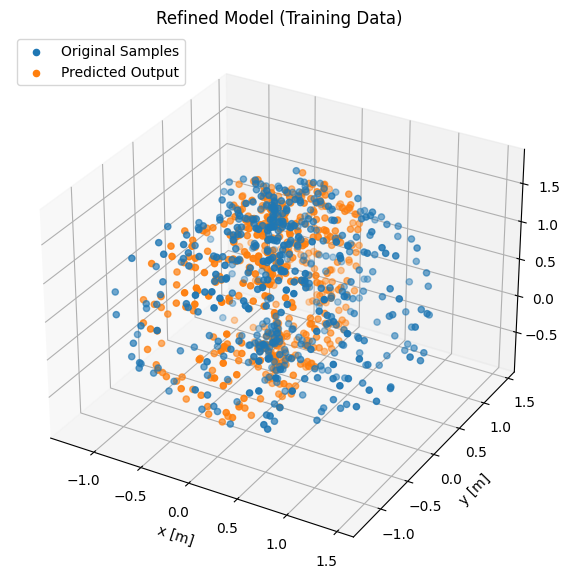

In [299]:
fig = plt.figure(figsize = (10, 7))
ax = plt.axes(projection ="3d")
 
## training output
ax.scatter3D(Y_orig_train[0:500, 0], Y_orig_train[0:500, 1], Y_orig_train[0:500, 2], 'ro', label='Original Samples')

## predicted output
ax.scatter3D(y_new3_train[0:500, 0], y_new3_train[0:500, 1], y_new3_train[0:500, 2], 'ko', label='Predicted Output')
plt.title('Refined Model (Training Data)')
plt.xlabel('x [m]')
plt.ylabel('y [m]')
plt.legend(loc="upper left")
    
plt.show()

In [300]:
import pickle 
    
with open('model_refined/y_new_third_layer.data', 'wb') as filehandle:
     # store the data as binary data stream
     pickle.dump(y_new3_train, filehandle)

## Repair the network with the modification of the second layer

### Replicate the Original NN

#### Classes (NN with Numpy)

In [301]:
X0 = X0_new3_train
X1 = X1_new3_train
X2 = X2_new3_train

num_samples = X0.shape[0]

model_lay2 = pyo.ConcreteModel()
model_lay2.w0 = pyo.Var(range(num_hidden_0), range(num_hidden_1), domain=pyo.Reals, bounds=(-10,10))
model_lay2.b0 = pyo.Var(range(num_hidden_1), domain=pyo.Reals, bounds=(-10,10))
model_lay2.x3 = pyo.Var(range(num_samples), range(num_output), domain=pyo.Reals, bounds=(-10,10))

model_lay2.eq_constraint_0 = pyo.ConstraintList()
model_lay2.ineq_constraint_0 = pyo.ConstraintList()
model_lay2.eq_constraint_1 = pyo.ConstraintList()
model_lay2.ineq_constraint_1 = pyo.ConstraintList()
model_lay2.eq_constraint_2 = pyo.ConstraintList()

for n in range(num_samples):
    
    ## second layer constraints
    for i in range(num_hidden_1):
        
        # form the constraint
        product = model_lay2.b0[i]
        for r in range(num_hidden_0):
            product += np.round(X0[n, r], 7) * model_lay2.w0[r, i]
        
        # if this node is activated
        if X1[n,i] > 0:   
            
            # define variable for this node
            x_l = 'x1'+ str(i)+ '_' + str(n)
            setattr(model_lay2, x_l, pyo.Var(domain=pyo.NonNegativeReals, bounds=(-10,10))) # it should be non negative (can get zero)
                
            # add the constraint
            model_lay2.eq_constraint_0.add(product == getattr(model_lay2, x_l))
        
        # if this node is not activated
        else:
            model_lay2.ineq_constraint_0.add(0>=product)
    
    
    ## third layer constraints
    for j in range(num_hidden_2):
        
        # form the constraint
        product = 0
        for r in range(num_hidden_1):
            
            # if the previous node is activated
            if X1[n,r] > 0:
                
                # define variable for this node
                x_l = 'x1'+ str(r)+ '_' + str(n)
                
                product += getattr(model_lay2, x_l) * np.round(w2_new[r, j],7)
        product += np.round(b2_new[j],7)
        
        # Now check if this product is negative or positive in the original net
        
        # if this node is activated
        if X2[n,j] > 0:
            # define variable for this node
            x_l = 'x2'+ str(j)+ '_' + str(n)
            setattr(model_lay2, x_l, pyo.Var(domain=pyo.NonNegativeReals, bounds=(-10,10))) # it should be non negative (can get zero)
            
            # add the constraint
            model_lay2.eq_constraint_1.add(0 == getattr(model_lay2, x_l)-product)
        
        # if this node is not activated
        else:
            model_lay2.ineq_constraint_1.add(0>=product)
    
    ## last layer constraints
    for k in range(num_output):
        
        # form the constraint
        product = 0
        for r in range(num_hidden_2):
            
            # if this node is activated
            if X2[n,r] > 0:
                
                # define variable for this node
                x_l = 'x2'+ str(r)+ '_' + str(n)
                
                product += getattr(model_lay2, x_l) * np.round(w3_new[r, k],7)
        product += np.round(b3_new[k],7)
            
        # add the constraint
        model_lay2.eq_constraint_2.add(product == model_lay2.x3[n, k])
                
                
## in-bound constraints for the last layer
x_l = 'x3'

def constraint_inside0(model, i):
             return(getattr(model, x_l)[i, 0] - 0.5 <= 0)
    
setattr(model_lay2, 'keep_inside_constraint_0'+str(3),
         pyo.Constraint(range(num_samples), rule=constraint_inside0))

In [302]:
# original_stdout = sys.stdout # Save a reference to the original standard output

# with open('third_layer_mip_model_6DOF.txt', 'w') as f:
#     sys.stdout = f # Change the standard output to the file we created.
#     model_lay3.pprint()
#     sys.stdout = original_stdout # Reset the standard output to its original value

#### Final Output and Ojbective

In [303]:
def squared_sum(x, y, m, n):
    _squared_sum = 0
    for i in range(m):
        for j in range(n):
            _squared_sum += (x[i, j] - y[i, j]) ** 2
    return _squared_sum

cost_expr = squared_sum(model_lay2.x3, np.round(y_train,7), num_samples, num_output) ## check correctness

# regularization term for weigts
for j in range(num_hidden_1):
    cost_expr += regularizer_rate*model_lay2.b0[j]**2
    for i in range(num_hidden_0):
        cost_expr += regularizer_rate*model_lay2.w0[i, j]**2



model_lay2.obj = pyo.Objective(expr=cost_expr)
pyo.TransformationFactory('gdp.bigm').apply_to(model_lay2)
opt = pyo.SolverFactory('gurobi')
opt.options['TimeLimit'] = 500
opt.options['mipgap'] = 0.04
opt.solve(model_lay2, tee=True)


Using license file C:\Users\kmajd1\gurobi.lic
Academic license - for non-commercial use only - expires 2021-07-25
Read LP format model from file C:\Users\kmajd1\AppData\Local\Temp\tmpj_oai4l2.pyomo.lp
Reading time = 9.14 seconds
: 360001 rows, 233521 columns, 4865701 nonzeros
Changed value of parameter TimeLimit to 500.0
   Prev: inf  Min: 0.0  Max: inf  Default: inf
Changed value of parameter mipgap to 0.04
   Prev: 0.0001  Min: 0.0  Max: inf  Default: 0.0001
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (win64)
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads
Optimize a model with 360001 rows, 233521 columns and 4865701 nonzeros
Model fingerprint: 0x8b1c162e
Model has 32420 quadratic objective terms
Coefficient statistics:
  Matrix range     [8e-07, 2e+00]
  Objective range  [1e-04, 2e+04]
  QObjective range [2e-04, 2e+00]
  Bounds range     [1e+01, 1e+01]
  RHS range        [1e-03, 1e+00]
Presolve removed 24011 rows and 1 columns
Presolve time: 1.11s
Pr

{'Problem': [{'Name': '', 'Lower bound': 620.525862156981, 'Upper bound': 620.525862156981, 'Number of objectives': 1, 'Number of constraints': 360001, 'Number of variables': 233521, 'Number of binary variables': 0, 'Number of integer variables': 0, 'Number of continuous variables': 233521, 'Number of nonzeros': 4865701, 'Sense': 'minimize'}], 'Solver': [{'Status': 'ok', 'Return code': '0', 'Message': 'Model was solved to optimality (subject to tolerances), and an optimal solution is available.', 'Termination condition': 'optimal', 'Termination message': 'Model was solved to optimality (subject to tolerances), and an optimal solution is available.', 'Wall time': '59.016836166381836', 'Error rc': 0, 'Time': 69.68953371047974}], 'Solution': [OrderedDict([('number of solutions', 0), ('number of solutions displayed', 0)])]}

In [304]:
model_lay2.w0.display()

w0 : Size=400, Index=w0_index
    Key      : Lower : Value                   : Upper : Fixed : Stale : Domain
      (0, 0) :   -10 :    -0.14958236197543684 :    10 : False : False :  Reals
      (0, 1) :   -10 :      0.1359664006725172 :    10 : False : False :  Reals
      (0, 2) :   -10 :    -0.13283797523589058 :    10 : False : False :  Reals
      (0, 3) :   -10 :    -0.13427433225083085 :    10 : False : False :  Reals
      (0, 4) :   -10 :     -0.0783202379019663 :    10 : False : False :  Reals
      (0, 5) :   -10 :    -0.08365162728866693 :    10 : False : False :  Reals
      (0, 6) :   -10 :     0.04713094792216488 :    10 : False : False :  Reals
      (0, 7) :   -10 :      0.0742346939010865 :    10 : False : False :  Reals
      (0, 8) :   -10 :    -0.27586763956297666 :    10 : False : False :  Reals
      (0, 9) :   -10 :    0.024405850195682532 :    10 : False : False :  Reals
     (0, 10) :   -10 :   -0.010976859611057321 :    10 : False : False :  Reals
     (0, 1

In [305]:
model_lay2.b0.display()

b0 : Size=20, Index=b0_index
    Key : Lower : Value                 : Upper : Fixed : Stale : Domain
      0 :   -10 :   0.07103595707320487 :    10 : False : False :  Reals
      1 :   -10 :  0.047853387394289015 :    10 : False : False :  Reals
      2 :   -10 :   -0.0321097915357651 :    10 : False : False :  Reals
      3 :   -10 :  -0.01953700899044719 :    10 : False : False :  Reals
      4 :   -10 :   0.14881338502659958 :    10 : False : False :  Reals
      5 :   -10 :    0.1257662563427413 :    10 : False : False :  Reals
      6 :   -10 :    0.0511427594845415 :    10 : False : False :  Reals
      7 :   -10 : -0.056687237190299555 :    10 : False : False :  Reals
      8 :   -10 :   0.03530745506277633 :    10 : False : False :  Reals
      9 :   -10 :  0.023200225598614566 :    10 : False : False :  Reals
     10 :   -10 :   -0.0325291559882146 :    10 : False : False :  Reals
     11 :   -10 :   0.04271064072955966 :    10 : False : False :  Reals
     12 :   -10 :   0.

In [306]:
print(w1_orig) #previously trained nn weights

[[-1.4784e-01  1.4043e-01 -1.3347e-01 -1.3709e-01 -7.6130e-02 -8.4800e-02
   5.0140e-02  7.4360e-02 -2.7511e-01  3.0600e-02 -2.2070e-02 -5.6940e-02
   2.2242e-01  2.9276e-01  3.5200e-02 -2.3370e-02  5.5250e-02 -1.3846e-01
  -1.0177e-01 -3.6518e-01]
 [-4.7110e-02 -1.1520e-02 -4.6940e-02 -2.1839e-01 -1.0701e-01 -8.6860e-02
  -8.7640e-02 -5.7350e-02 -1.7000e-03  8.9510e-02 -4.7210e-02  9.5560e-02
   1.1432e-01  2.7264e-01  2.9250e-02 -7.1970e-02 -6.4320e-02 -5.8010e-02
  -7.9540e-02 -7.5470e-02]
 [ 1.0285e-01 -3.8300e-02 -4.7940e-02 -7.6970e-02 -6.6090e-02 -7.9400e-02
  -1.6807e-01 -1.9444e-01  1.4167e-01  1.8678e-01  1.0738e-01  1.5587e-01
  -1.1475e-01  2.1741e-01  5.6550e-02 -2.9910e-02  2.6053e-01  1.6148e-01
  -9.3380e-02  2.1538e-01]
 [-1.2121e-01 -1.9662e-01  9.9540e-02 -2.2340e-02  2.0664e-01 -2.0302e-01
  -1.1535e-01 -1.1821e-01  9.7900e-02 -4.0830e-02  1.5120e-02 -1.6490e-02
  -9.9380e-02 -7.8110e-02 -2.0530e-02  1.7909e-01  2.9024e-01  3.6308e-01
   1.6671e-01  9.2110e-02]
 [-1

In [307]:
model_lay2.x3.display()

x3 : Size=32000, Index=x3_index
    Key       : Lower : Value                   : Upper : Fixed : Stale : Domain
       (0, 0) :   -10 :     0.36281211238512867 :    10 : False : False :  Reals
       (0, 1) :   -10 :     -0.5945841305047583 :    10 : False : False :  Reals
       (0, 2) :   -10 :    -0.03159787753938481 :    10 : False : False :  Reals
       (0, 3) :   -10 :       1.000329646941866 :    10 : False : False :  Reals
       (1, 0) :   -10 :     0.02124267005760494 :    10 : False : False :  Reals
       (1, 1) :   -10 :      0.9592607046197639 :    10 : False : False :  Reals
       (1, 2) :   -10 :      0.6628346772788181 :    10 : False : False :  Reals
       (1, 3) :   -10 :       1.000215186622004 :    10 : False : False :  Reals
       (2, 0) :   -10 :   -0.008367115108962153 :    10 : False : False :  Reals
       (2, 1) :   -10 :   -0.001987803648242803 :    10 : False : False :  Reals
       (2, 2) :   -10 :      1.7057546487077442 :    10 : False : False :  Re

     (359, 1) :   -10 :    -0.17382943462681055 :    10 : False : False :  Reals
     (359, 2) :   -10 :     -0.7210619046729985 :    10 : False : False :  Reals
     (359, 3) :   -10 :      1.0001036795532592 :    10 : False : False :  Reals
     (360, 0) :   -10 :   -0.048061159268204534 :    10 : False : False :  Reals
     (360, 1) :   -10 :    -0.03669126700643055 :    10 : False : False :  Reals
     (360, 2) :   -10 :      1.7468847648521333 :    10 : False : False :  Reals
     (360, 3) :   -10 :      1.0002358587329976 :    10 : False : False :  Reals
     (361, 0) :   -10 :    -0.37402165771095675 :    10 : False : False :  Reals
     (361, 1) :   -10 :     0.19931783668269176 :    10 : False : False :  Reals
     (361, 2) :   -10 :      1.2279805430308688 :    10 : False : False :  Reals
     (361, 3) :   -10 :      1.0001869718717273 :    10 : False : False :  Reals
     (362, 0) :   -10 :    0.041454366135617704 :    10 : False : False :  Reals
     (362, 1) :   -10 :   -0

    (1014, 2) :   -10 :   -0.005186917580479289 :    10 : False : False :  Reals
    (1014, 3) :   -10 :      1.0002510034759435 :    10 : False : False :  Reals
    (1015, 0) :   -10 :     0.43151823835517256 :    10 : False : False :  Reals
    (1015, 1) :   -10 :    -0.46395752024577774 :    10 : False : False :  Reals
    (1015, 2) :   -10 :      0.6139998273855998 :    10 : False : False :  Reals
    (1015, 3) :   -10 :      1.0003254117440576 :    10 : False : False :  Reals
    (1016, 0) :   -10 :      0.3264784163142842 :    10 : False : False :  Reals
    (1016, 1) :   -10 :     0.23754082649837294 :    10 : False : False :  Reals
    (1016, 2) :   -10 :    -0.03407930499370693 :    10 : False : False :  Reals
    (1016, 3) :   -10 :      1.0003196148508273 :    10 : False : False :  Reals
    (1017, 0) :   -10 :     0.09973409204726025 :    10 : False : False :  Reals
    (1017, 1) :   -10 :     -0.5399325752347544 :    10 : False : False :  Reals
    (1017, 2) :   -10 :     

    (1645, 2) :   -10 :      1.4149197735301282 :    10 : False : False :  Reals
    (1645, 3) :   -10 :      1.0003359558840685 :    10 : False : False :  Reals
    (1646, 0) :   -10 :      0.1146688488558052 :    10 : False : False :  Reals
    (1646, 1) :   -10 :      1.1600832017573364 :    10 : False : False :  Reals
    (1646, 2) :   -10 :    -0.12134089928868264 :    10 : False : False :  Reals
    (1646, 3) :   -10 :      1.0001621098699331 :    10 : False : False :  Reals
    (1647, 0) :   -10 :     0.21190090895234803 :    10 : False : False :  Reals
    (1647, 1) :   -10 :     -0.6646219437663774 :    10 : False : False :  Reals
    (1647, 2) :   -10 :      1.4392934089563774 :    10 : False : False :  Reals
    (1647, 3) :   -10 :      1.0002617391475255 :    10 : False : False :  Reals
    (1648, 0) :   -10 :      0.4185842038347509 :    10 : False : False :  Reals
    (1648, 1) :   -10 :    0.023670733212489026 :    10 : False : False :  Reals
    (1648, 2) :   -10 :     

    (2388, 1) :   -10 :      1.3308463392576435 :    10 : False : False :  Reals
    (2388, 2) :   -10 :    -0.12855196632390253 :    10 : False : False :  Reals
    (2388, 3) :   -10 :      1.0001202906591402 :    10 : False : False :  Reals
    (2389, 0) :   -10 :     0.15215686744307533 :    10 : False : False :  Reals
    (2389, 1) :   -10 :   -0.022043325221483556 :    10 : False : False :  Reals
    (2389, 2) :   -10 :      1.6305080828227165 :    10 : False : False :  Reals
    (2389, 3) :   -10 :      1.0002627203378616 :    10 : False : False :  Reals
    (2390, 0) :   -10 :     0.19555130286290812 :    10 : False : False :  Reals
    (2390, 1) :   -10 :     0.41335468166223244 :    10 : False : False :  Reals
    (2390, 2) :   -10 :    -0.23109820290315497 :    10 : False : False :  Reals
    (2390, 3) :   -10 :      1.0002191609339341 :    10 : False : False :  Reals
    (2391, 0) :   -10 :     0.19562599300062367 :    10 : False : False :  Reals
    (2391, 1) :   -10 :     

    (2872, 3) :   -10 :      1.0001935762326095 :    10 : False : False :  Reals
    (2873, 0) :   -10 :     -0.3841891932112098 :    10 : False : False :  Reals
    (2873, 1) :   -10 :     -0.6779008726234146 :    10 : False : False :  Reals
    (2873, 2) :   -10 :      -0.545562335502261 :    10 : False : False :  Reals
    (2873, 3) :   -10 :      1.0001114868927967 :    10 : False : False :  Reals
    (2874, 0) :   -10 :      -0.473748983451566 :    10 : False : False :  Reals
    (2874, 1) :   -10 :      0.2621113738639185 :    10 : False : False :  Reals
    (2874, 2) :   -10 :     -0.7763129109378504 :    10 : False : False :  Reals
    (2874, 3) :   -10 :      0.9999839629466418 :    10 : False : False :  Reals
    (2875, 0) :   -10 :     -0.5713732412622825 :    10 : False : False :  Reals
    (2875, 1) :   -10 :     -1.2241755267123722 :    10 : False : False :  Reals
    (2875, 2) :   -10 :      0.3070382699179248 :    10 : False : False :  Reals
    (2875, 3) :   -10 :     

    (3391, 2) :   -10 :      1.6913259662027418 :    10 : False : False :  Reals
    (3391, 3) :   -10 :       1.000233405736937 :    10 : False : False :  Reals
    (3392, 0) :   -10 :     0.33296497452466767 :    10 : False : False :  Reals
    (3392, 1) :   -10 :    -0.43479058346915167 :    10 : False : False :  Reals
    (3392, 2) :   -10 :      1.6291438557644309 :    10 : False : False :  Reals
    (3392, 3) :   -10 :      1.0003093149941442 :    10 : False : False :  Reals
    (3393, 0) :   -10 :     0.39797667552085336 :    10 : False : False :  Reals
    (3393, 1) :   -10 :     -0.6101843050632301 :    10 : False : False :  Reals
    (3393, 2) :   -10 :     0.39527577462112085 :    10 : False : False :  Reals
    (3393, 3) :   -10 :      1.0003976336747051 :    10 : False : False :  Reals
    (3394, 0) :   -10 :     -0.4332445520773156 :    10 : False : False :  Reals
    (3394, 1) :   -10 :     0.30486147308388034 :    10 : False : False :  Reals
    (3394, 2) :   -10 :     

    (3930, 1) :   -10 :      0.5222535884642223 :    10 : False : False :  Reals
    (3930, 2) :   -10 :    -0.15348189630144127 :    10 : False : False :  Reals
    (3930, 3) :   -10 :       1.000221932696709 :    10 : False : False :  Reals
    (3931, 0) :   -10 :      0.0670782494554043 :    10 : False : False :  Reals
    (3931, 1) :   -10 :   -0.006090531733070392 :    10 : False : False :  Reals
    (3931, 2) :   -10 :     -0.3972806446635886 :    10 : False : False :  Reals
    (3931, 3) :   -10 :      1.0000893961478496 :    10 : False : False :  Reals
    (3932, 0) :   -10 :    0.059164695453759464 :    10 : False : False :  Reals
    (3932, 1) :   -10 :      0.6834272300115973 :    10 : False : False :  Reals
    (3932, 2) :   -10 :        1.62789590880063 :    10 : False : False :  Reals
    (3932, 3) :   -10 :      1.0001947646476879 :    10 : False : False :  Reals
    (3933, 0) :   -10 :     0.24013710613763983 :    10 : False : False :  Reals
    (3933, 1) :   -10 :    0

    (4641, 1) :   -10 :     0.45573741416216684 :    10 : False : False :  Reals
    (4641, 2) :   -10 :      1.1792113973660214 :    10 : False : False :  Reals
    (4641, 3) :   -10 :      1.0002555389375374 :    10 : False : False :  Reals
    (4642, 0) :   -10 :    0.005575453838696731 :    10 : False : False :  Reals
    (4642, 1) :   -10 :    0.012002464289608383 :    10 : False : False :  Reals
    (4642, 2) :   -10 :      1.3783984217355911 :    10 : False : False :  Reals
    (4642, 3) :   -10 :       1.000220115634626 :    10 : False : False :  Reals
    (4643, 0) :   -10 :     0.05467546345537677 :    10 : False : False :  Reals
    (4643, 1) :   -10 :      0.1793448090968841 :    10 : False : False :  Reals
    (4643, 2) :   -10 :     -0.7895724778784423 :    10 : False : False :  Reals
    (4643, 3) :   -10 :      1.0001468042535588 :    10 : False : False :  Reals
    (4644, 0) :   -10 :     0.14739133718135378 :    10 : False : False :  Reals
    (4644, 1) :   -10 :    0

    (5287, 1) :   -10 :      0.9916057067687607 :    10 : False : False :  Reals
    (5287, 2) :   -10 :         0.7212908452394 :    10 : False : False :  Reals
    (5287, 3) :   -10 :      1.0001974304071393 :    10 : False : False :  Reals
    (5288, 0) :   -10 :     0.41464288219548884 :    10 : False : False :  Reals
    (5288, 1) :   -10 :    -0.03854543024805146 :    10 : False : False :  Reals
    (5288, 2) :   -10 :      0.6736180779566556 :    10 : False : False :  Reals
    (5288, 3) :   -10 :      1.0003304673455329 :    10 : False : False :  Reals
    (5289, 0) :   -10 :     0.09180205743969339 :    10 : False : False :  Reals
    (5289, 1) :   -10 :     -0.2808790479832446 :    10 : False : False :  Reals
    (5289, 2) :   -10 :     -0.2944848962538309 :    10 : False : False :  Reals
    (5289, 3) :   -10 :      1.0001526952409137 :    10 : False : False :  Reals
    (5290, 0) :   -10 :       0.499191332741308 :    10 : False : False :  Reals
    (5290, 1) :   -10 :     

    (5863, 2) :   -10 :     -0.1086126646338954 :    10 : False : False :  Reals
    (5863, 3) :   -10 :       1.000229564168066 :    10 : False : False :  Reals
    (5864, 0) :   -10 :     0.45221327925796473 :    10 : False : False :  Reals
    (5864, 1) :   -10 :   -0.023279518253493947 :    10 : False : False :  Reals
    (5864, 2) :   -10 :     0.23783168145710043 :    10 : False : False :  Reals
    (5864, 3) :   -10 :      1.0003631335552807 :    10 : False : False :  Reals
    (5865, 0) :   -10 :      0.3463188593350388 :    10 : False : False :  Reals
    (5865, 1) :   -10 :     -0.3443006249606988 :    10 : False : False :  Reals
    (5865, 2) :   -10 :      1.4697437565699367 :    10 : False : False :  Reals
    (5865, 3) :   -10 :      1.0003114762838816 :    10 : False : False :  Reals
    (5866, 0) :   -10 :     0.02877992119837458 :    10 : False : False :  Reals
    (5866, 1) :   -10 :       0.299884950172995 :    10 : False : False :  Reals
    (5866, 2) :   -10 :    0

    (6498, 2) :   -10 :      0.1669601142048993 :    10 : False : False :  Reals
    (6498, 3) :   -10 :      1.0002373891109553 :    10 : False : False :  Reals
    (6499, 0) :   -10 :     -0.6581521315825274 :    10 : False : False :  Reals
    (6499, 1) :   -10 :      0.5399675192320021 :    10 : False : False :  Reals
    (6499, 2) :   -10 :     -0.7758759608401729 :    10 : False : False :  Reals
    (6499, 3) :   -10 :       0.999970809667591 :    10 : False : False :  Reals
    (6500, 0) :   -10 :     0.23444414739348396 :    10 : False : False :  Reals
    (6500, 1) :   -10 :      0.8119439213756152 :    10 : False : False :  Reals
    (6500, 2) :   -10 :    -0.33260275243097226 :    10 : False : False :  Reals
    (6500, 3) :   -10 :       1.000124383859232 :    10 : False : False :  Reals
    (6501, 0) :   -10 :      0.4437243713836754 :    10 : False : False :  Reals
    (6501, 1) :   -10 :    -0.38791407488442253 :    10 : False : False :  Reals
    (6501, 2) :   -10 :    0

    (7076, 1) :   -10 :    -0.34656709976015243 :    10 : False : False :  Reals
    (7076, 2) :   -10 :      1.5415831495932775 :    10 : False : False :  Reals
    (7076, 3) :   -10 :      1.0002812426784793 :    10 : False : False :  Reals
    (7077, 0) :   -10 :    -0.24509336377257007 :    10 : False : False :  Reals
    (7077, 1) :   -10 :      0.5932273951048845 :    10 : False : False :  Reals
    (7077, 2) :   -10 :     -0.2917713624940266 :    10 : False : False :  Reals
    (7077, 3) :   -10 :      1.0001758212609797 :    10 : False : False :  Reals
    (7078, 0) :   -10 :     0.13209685359704615 :    10 : False : False :  Reals
    (7078, 1) :   -10 :      0.9034384092052701 :    10 : False : False :  Reals
    (7078, 2) :   -10 :      0.9418403686915457 :    10 : False : False :  Reals
    (7078, 3) :   -10 :       1.000254338811569 :    10 : False : False :  Reals
    (7079, 0) :   -10 :     -0.5282857380472326 :    10 : False : False :  Reals
    (7079, 1) :   -10 :     

    (7641, 0) :   -10 :       0.460521721947762 :    10 : False : False :  Reals
    (7641, 1) :   -10 :      0.3083573945922442 :    10 : False : False :  Reals
    (7641, 2) :   -10 :      0.6159952223984639 :    10 : False : False :  Reals
    (7641, 3) :   -10 :      1.0002694589098216 :    10 : False : False :  Reals
    (7642, 0) :   -10 :      0.1666927669794287 :    10 : False : False :  Reals
    (7642, 1) :   -10 :     0.14773778056754594 :    10 : False : False :  Reals
    (7642, 2) :   -10 :      1.0779466487415128 :    10 : False : False :  Reals
    (7642, 3) :   -10 :      1.0002296415372474 :    10 : False : False :  Reals
    (7643, 0) :   -10 :       0.204783974181451 :    10 : False : False :  Reals
    (7643, 1) :   -10 :      0.2349934320847904 :    10 : False : False :  Reals
    (7643, 2) :   -10 :      1.1376604179685188 :    10 : False : False :  Reals
    (7643, 3) :   -10 :       1.000246828336449 :    10 : False : False :  Reals
    (7644, 0) :   -10 :     

In [308]:
print(Y_orig_train)

[[ 0.65708267 -0.58000534 -0.03254414  1.00744405]
 [ 0.10891444  0.94599617  0.65292399  0.99906863]
 [-0.00352613  0.01305309  1.71228234  1.00629797]
 ...
 [-0.36635572 -0.79160683  0.24150269  1.00039181]
 [-0.17841943 -0.88072382  0.17885248  1.00357333]
 [ 0.042479   -1.36906006  0.81773695  1.00204036]]


In [309]:
X3_new = np.zeros((num_samples,num_output))
w1_new = np.zeros((num_hidden_0,num_hidden_1))
b1_new = np.zeros((num_hidden_1))
for i in range(num_samples):
    for j in range(num_output):
        X3_new[i, j] = model_lay2.x3[i, j].value
for j in range(num_hidden_2):
    b1_new[j] = model_lay2.b0[j].value
    for i in range(num_hidden_1):
        w1_new[i, j] = model_lay2.w0[i, j].value
print(w1_new)
print(b1_new)

[[-1.49582362e-01  1.35966401e-01 -1.32837975e-01 -1.34274332e-01
  -7.83202379e-02 -8.36516273e-02  4.71309479e-02  7.42346939e-02
  -2.75867640e-01  2.44058502e-02 -1.09768596e-02 -5.63824496e-02
   2.18900084e-01  2.93283743e-01  2.62926000e-02 -2.48478189e-02
   5.69368876e-02 -1.41524243e-01 -1.06223194e-01 -3.69053177e-01]
 [-4.76408592e-02 -1.15413342e-02 -4.26349399e-02 -2.20613190e-01
  -1.11373212e-01 -9.36708596e-02 -8.99844366e-02 -5.74050743e-02
   1.13711714e-03  8.71427974e-02 -4.09642830e-02  9.60019194e-02
   1.16215510e-01  2.69422276e-01  2.96869294e-02 -7.20198091e-02
  -6.49699833e-02 -5.18445559e-02 -8.39963613e-02 -7.35905198e-02]
 [ 9.91913410e-02 -3.84655631e-02 -3.06191386e-02 -8.20226733e-02
  -7.47595159e-02 -8.70238792e-02 -1.55680345e-01 -2.10793793e-01
   1.51785269e-01  1.79685835e-01  1.03568017e-01  1.56545895e-01
  -1.20691496e-01  2.17695677e-01  7.15210560e-02 -3.01495588e-02
   2.53409070e-01  1.51880093e-01 -8.78620353e-02  2.12749226e-01]
 [-1.22

#### Build Refined NN 

In [310]:
mlp_lay2 = MLP(num_input, num_output, [num_hidden_0, num_hidden_1, num_hidden_2])
mlp_lay2.layers[0].weights=w0_orig   
mlp_lay2.layers[1].weights=w1_new 
mlp_lay2.layers[2].weights=w2_new  
mlp_lay2.layers[3].weights=w3_new  
mlp_lay2.layers[0].bias=b0_orig
mlp_lay2.layers[1].bias=b1_new
mlp_lay2.layers[2].bias=b2_new
mlp_lay2.layers[3].bias=b3_new

X0_new2_train, X1_new2_train, X2_new2_train, y_new2_train = mlp_lay2(x_train, relu=False)

In [311]:
y_new2_train

array([[ 0.36281209, -0.594584  , -0.03159778,  1.00032967],
       [ 0.02124261,  0.95926088,  0.66283468,  1.0002152 ],
       [-0.00836716, -0.00198773,  1.70575464,  1.00026858],
       ...,
       [-0.28423053, -0.79450107,  0.25214957,  1.00029832],
       [-0.18646805, -0.88514772,  0.18782281,  1.00034366],
       [-0.10950702, -1.38041934,  0.81415995,  1.00025456]])

In [312]:
X3_new

array([[ 0.36281211, -0.59458413, -0.03159788,  1.00032965],
       [ 0.02124267,  0.9592607 ,  0.66283468,  1.00021519],
       [-0.00836712, -0.0019878 ,  1.70575465,  1.00026851],
       ...,
       [-0.28423043, -0.79450114,  0.25214949,  1.0002983 ],
       [-0.18646797, -0.88514788,  0.18782278,  1.00034365],
       [-0.10950689, -1.3804194 ,  0.81415991,  1.00025455]])

#### Plot New Results

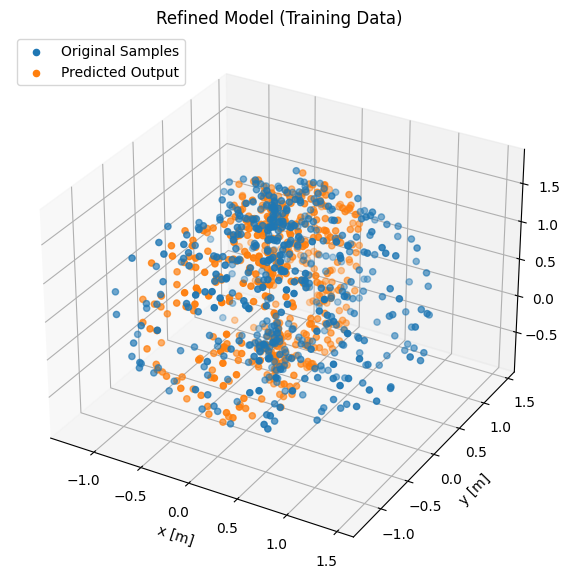

In [313]:
fig = plt.figure(figsize = (10, 7))
ax = plt.axes(projection ="3d")
 
## training output
ax.scatter3D(Y_orig_train[0:500, 0], Y_orig_train[0:500, 1], Y_orig_train[0:500, 2], 'ro', label='Original Samples')

## predicted output
ax.scatter3D(y_new2_train[0:500, 0], y_new2_train[0:500, 1], y_new2_train[0:500, 2], 'ko', label='Predicted Output')
plt.title('Refined Model (Training Data)')
plt.xlabel('x [m]')
plt.ylabel('y [m]')
plt.legend(loc="upper left")
    
plt.show()

In [314]:
import pickle 
    
with open('model_refined/y_new_second_layer.data', 'wb') as filehandle:
     # store the data as binary data stream
     pickle.dump(y_new2_train, filehandle)

## Repair the network with the modification of the first layer

### Replicate the Original NN

#### Classes (NN with Numpy)

In [317]:
x_train.shape

(8000, 12)

In [316]:
X = x_train
X0 = X0_new2_train
X1 = X1_new2_train
X2 = X2_new2_train

num_samples = X.shape[0]

model_lay1 = pyo.ConcreteModel()
model_lay1.w0 = pyo.Var(range(num_input), range(num_hidden_0), domain=pyo.Reals, bounds=(-10,10))
model_lay1.b0 = pyo.Var(range(num_hidden_0), domain=pyo.Reals, bounds=(-10,10))
model_lay1.x3 = pyo.Var(range(num_samples), range(num_output), domain=pyo.Reals, bounds=(-10,10))

model_lay1.eq_constraint_0 = pyo.ConstraintList()
model_lay1.ineq_constraint_0 = pyo.ConstraintList()
model_lay1.eq_constraint_1 = pyo.ConstraintList()
model_lay1.ineq_constraint_1 = pyo.ConstraintList()
model_lay1.eq_constraint_2 = pyo.ConstraintList()
model_lay1.ineq_constraint_2 = pyo.ConstraintList()
model_lay1.eq_constraint_3 = pyo.ConstraintList()

for n in range(num_samples):
    
    ## first layer constraints
    for q in range(num_hidden_0):
        
        # form the constraint
        product = model_lay1.b0[q]
        for r in range(num_input):
            product += np.round(X[n, r], 7) * model_lay1.w0[r, q]
        
        # if this node is activated
        if X0[n,q] > 0:   
            
            # define variable for this node
            x_l = 'x0'+ str(q)+ '_' + str(n)
            setattr(model_lay1, x_l, pyo.Var(domain=pyo.NonNegativeReals, bounds=(-10,10))) # it should be non negative (can get zero)
                
            # add the constraint
            model_lay1.eq_constraint_0.add(product == getattr(model_lay1, x_l))
        
        # if this node is not activated
        else:
            model_lay1.ineq_constraint_0.add(0>=product)    
    
    ## second layer constraints
    for i in range(num_hidden_1):
        
        # form the constraint
        product = 0
        for r in range(num_hidden_0):
            
            # if the previous node is activated
            if X0[n,r] > 0:
                
                # define variable for this node
                x_l = 'x0'+ str(r)+ '_' + str(n)
                
                product += getattr(model_lay1, x_l) * np.round(w1_new[r, i],7)
        product += np.round(b1_new[i],7)
        
        # Now check if this product is negative or positive in the original net
        
        # if this node is activated
        if X1[n,i] > 0:
            # define variable for this node
            x_l = 'x1'+ str(i)+ '_' + str(n)
            setattr(model_lay1, x_l, pyo.Var(domain=pyo.NonNegativeReals, bounds=(-10,10))) # it should be non negative (can get zero)
            
            # add the constraint
            model_lay1.eq_constraint_1.add(0 == getattr(model_lay1, x_l)-product)
        
        # if this node is not activated
        else:
            model_lay1.ineq_constraint_1.add(0>=product)
    
    
    ## third layer constraints
    for j in range(num_hidden_2):
        
        # form the constraint
        product = 0
        for r in range(num_hidden_1):
            
            # if the previous node is activated
            if X1[n,r] > 0:
                
                # define variable for this node
                x_l = 'x1'+ str(r)+ '_' + str(n)
                
                product += getattr(model_lay1, x_l) * np.round(w2_new[r, j],7)
        product += np.round(b2_new[j],7)
        
        # Now check if this product is negative or positive in the original net
        
        # if this node is activated
        if X2[n,j] > 0:
            # define variable for this node
            x_l = 'x2'+ str(j)+ '_' + str(n)
            setattr(model_lay1, x_l, pyo.Var(domain=pyo.NonNegativeReals, bounds=(-10,10))) # it should be non negative (can get zero)
            
            # add the constraint
            model_lay1.eq_constraint_2.add(0 == getattr(model_lay1, x_l)-product)
        
        # if this node is not activated
        else:
            model_lay1.ineq_constraint_2.add(0>=product)
    
    ## last layer constraints
    for k in range(num_output):
        
        # form the constraint
        product = 0
        for r in range(num_hidden_2):
            
            # if the previous node is activated
            if X2[n,r] > 0:
                
                # define variable for this node
                x_l = 'x2'+ str(r)+ '_' + str(n)
                
                product += getattr(model_lay1, x_l) * np.round(w3_new[r, k],7)
        product += np.round(b3_new[k],7)
            
        # add the constraint
        model_lay1.eq_constraint_3.add(product == model_lay1.x3[n, k])
                
                
## in-bound constraints for the last layer
x_l = 'x3'

def constraint_inside0(model, i):
             return(getattr(model, x_l)[i, 0] - 0.5 <= 0)
    
setattr(model_lay1, 'keep_inside_constraint_0'+str(3),
         pyo.Constraint(range(num_samples), rule=constraint_inside0))

In [318]:
X.shape

(8000, 12)

In [242]:
# original_stdout = sys.stdout # Save a reference to the original standard output

# with open('third_layer_mip_model_6DOF.txt', 'w') as f:
#     sys.stdout = f # Change the standard output to the file we created.
#     model_lay3.pprint()
#     sys.stdout = original_stdout # Reset the standard output to its original value

#### Final Output and Ojbective

In [319]:
def squared_sum(x, y, m, n):
    _squared_sum = 0
    for i in range(m):
        for j in range(n):
            _squared_sum += (x[i, j] - y[i, j]) ** 2
    return _squared_sum

cost_expr = squared_sum(model_lay1.x3, np.round(y_train,7), num_samples, num_output) ## check correctness

# regularization term for weigts
for j in range(num_hidden_0):
    cost_expr += regularizer_rate*model_lay1.b0[j]**2
    for i in range(num_input):
        cost_expr += regularizer_rate*model_lay1.w0[i, j]**2



model_lay1.obj = pyo.Objective(expr=cost_expr)
pyo.TransformationFactory('gdp.bigm').apply_to(model_lay1)
opt = pyo.SolverFactory('gurobi')
opt.options['TimeLimit'] = 600
opt.options['mipgap'] = 0.04
opt.solve(model_lay1, tee=True)


Using license file C:\Users\kmajd1\gurobi.lic
Academic license - for non-commercial use only - expires 2021-07-25
Read LP format model from file C:\Users\kmajd1\AppData\Local\Temp\tmpat11yp5p.pyomo.lp
Reading time = 12.98 seconds
: 520001 rows, 331173 columns, 6883201 nonzeros
Changed value of parameter TimeLimit to 600.0
   Prev: inf  Min: 0.0  Max: inf  Default: inf
Changed value of parameter mipgap to 0.04
   Prev: 0.0001  Min: 0.0  Max: inf  Default: 0.0001
Gurobi Optimizer version 9.1.0 build v9.1.0rc0 (win64)
Thread count: 8 physical cores, 16 logical processors, using up to 16 threads
Optimize a model with 520001 rows, 331173 columns and 6883201 nonzeros
Model fingerprint: 0x9e320b0e
Model has 32260 quadratic objective terms
Coefficient statistics:
  Matrix range     [8e-07, 2e+00]
  Objective range  [1e-04, 2e+04]
  QObjective range [2e-04, 2e+00]
  Bounds range     [1e+01, 1e+01]
  RHS range        [1e-03, 1e+00]
Presolve removed 24164 rows and 1 columns
Presolve time: 1.52s
P

{'Problem': [{'Name': '', 'Lower bound': 620.3202421829701, 'Upper bound': 620.3202421829701, 'Number of objectives': 1, 'Number of constraints': 520001, 'Number of variables': 331173, 'Number of binary variables': 0, 'Number of integer variables': 0, 'Number of continuous variables': 331173, 'Number of nonzeros': 6883201, 'Sense': 'minimize'}], 'Solver': [{'Status': 'ok', 'Return code': '0', 'Message': 'Model was solved to optimality (subject to tolerances), and an optimal solution is available.', 'Termination condition': 'optimal', 'Termination message': 'Model was solved to optimality (subject to tolerances), and an optimal solution is available.', 'Wall time': '73.81099700927734', 'Error rc': 0, 'Time': 89.06729745864868}], 'Solution': [OrderedDict([('number of solutions', 0), ('number of solutions displayed', 0)])]}

In [320]:
model_lay1.w0.display()

w0 : Size=240, Index=w0_index
    Key      : Lower : Value                   : Upper : Fixed : Stale : Domain
      (0, 0) :   -10 :   -0.029417105866519577 :    10 : False : False :  Reals
      (0, 1) :   -10 :   -0.011176368137970627 :    10 : False : False :  Reals
      (0, 2) :   -10 :     -0.3887774635994248 :    10 : False : False :  Reals
      (0, 3) :   -10 :    -0.49244661203912266 :    10 : False : False :  Reals
      (0, 4) :   -10 :    0.021514759907697467 :    10 : False : False :  Reals
      (0, 5) :   -10 :    -0.08862436006189434 :    10 : False : False :  Reals
      (0, 6) :   -10 :      0.4058082197907815 :    10 : False : False :  Reals
      (0, 7) :   -10 :     -0.2396800874360565 :    10 : False : False :  Reals
      (0, 8) :   -10 :    -0.03384890303369126 :    10 : False : False :  Reals
      (0, 9) :   -10 :    0.046602286103665236 :    10 : False : False :  Reals
     (0, 10) :   -10 :    0.035222160799660784 :    10 : False : False :  Reals
     (0, 1

In [321]:
model_lay1.b0.display()

b0 : Size=20, Index=b0_index
    Key : Lower : Value                 : Upper : Fixed : Stale : Domain
      0 :   -10 :   0.07796063707094092 :    10 : False : False :  Reals
      1 :   -10 :    0.2320690449518743 :    10 : False : False :  Reals
      2 :   -10 :    0.1146932094070987 :    10 : False : False :  Reals
      3 :   -10 :  -0.01941149956770971 :    10 : False : False :  Reals
      4 :   -10 :   0.16245532070564828 :    10 : False : False :  Reals
      5 :   -10 :   0.20136960756276778 :    10 : False : False :  Reals
      6 :   -10 :   0.09367836223838566 :    10 : False : False :  Reals
      7 :   -10 : -0.021081262893813957 :    10 : False : False :  Reals
      8 :   -10 :      0.09849731009772 :    10 : False : False :  Reals
      9 :   -10 :   0.26087677686743227 :    10 : False : False :  Reals
     10 :   -10 :  -0.16207400977167907 :    10 : False : False :  Reals
     11 :   -10 : -0.048755012517116114 :    10 : False : False :  Reals
     12 :   -10 :   0.

In [322]:
print(w0_orig) #previously trained nn weights

[[-2.9210e-02 -1.1110e-02 -3.8844e-01 -4.9238e-01  2.1750e-02 -8.8360e-02
   4.0570e-01 -2.3980e-01 -3.4010e-02  4.6480e-02  3.4990e-02  1.1190e-02
   3.2000e-03  3.3095e-01  3.4240e-02 -5.2170e-02  5.4110e-02 -4.2766e-01
   3.4045e-01  1.6537e-01]
 [-5.8000e-03  2.6972e-01  1.9677e-01  1.2881e-01 -3.7200e-03 -5.0947e-01
   1.6687e-01  2.1225e-01  4.3810e-02 -2.7340e-02  1.1333e-01  3.6700e-02
  -5.1220e-02  2.5719e-01  5.7856e-01  7.4530e-02  1.3830e-02 -1.5753e-01
  -1.3734e-01  1.5732e-01]
 [ 2.5337e-01  6.6060e-02  6.2120e-02 -4.1284e-01 -2.0665e-01  4.2540e-02
   1.1240e-01 -1.3640e-01 -2.4561e-01 -6.3187e-01  1.7161e-01  4.7200e-03
   4.7648e-01 -2.6537e-01  9.2920e-02  4.6364e-01 -4.4938e-01  9.8330e-02
   2.2751e-01 -8.5400e-03]
 [ 2.5263e-01 -5.1900e-03  3.2055e-01 -4.4000e-02  1.1654e-01  1.7726e-01
   2.5048e-01 -1.8880e-01  4.4657e-01  3.6698e-01 -5.1611e-01  5.1270e-02
  -3.9578e-01 -1.9742e-01  3.8224e-01 -3.2290e-02 -3.4143e-01  3.2416e-01
   5.1204e-01 -7.0000e-04]
 [-1

In [323]:
model_lay1.x3.display()

x3 : Size=32000, Index=x3_index
    Key       : Lower : Value                   : Upper : Fixed : Stale : Domain
       (0, 0) :   -10 :      0.3628429479329398 :    10 : False : False :  Reals
       (0, 1) :   -10 :     -0.5943183410563702 :    10 : False : False :  Reals
       (0, 2) :   -10 :    -0.03128498273473035 :    10 : False : False :  Reals
       (0, 3) :   -10 :      1.0003296158968027 :    10 : False : False :  Reals
       (1, 0) :   -10 :    0.020893242344044438 :    10 : False : False :  Reals
       (1, 1) :   -10 :      0.9595961253616991 :    10 : False : False :  Reals
       (1, 2) :   -10 :      0.6629711017869209 :    10 : False : False :  Reals
       (1, 3) :   -10 :      1.0002151215694006 :    10 : False : False :  Reals
       (2, 0) :   -10 :   -0.008398513308103261 :    10 : False : False :  Reals
       (2, 1) :   -10 :   -0.002115226061521369 :    10 : False : False :  Reals
       (2, 2) :   -10 :       1.706187946927594 :    10 : False : False :  Re

     (546, 3) :   -10 :      1.0004413770531144 :    10 : False : False :  Reals
     (547, 0) :   -10 :     0.11459127352871157 :    10 : False : False :  Reals
     (547, 1) :   -10 :    -0.07385270758367746 :    10 : False : False :  Reals
     (547, 2) :   -10 :      1.3517631713701075 :    10 : False : False :  Reals
     (547, 3) :   -10 :      1.0002413875819602 :    10 : False : False :  Reals
     (548, 0) :   -10 :     0.41697033503429104 :    10 : False : False :  Reals
     (548, 1) :   -10 :      0.5546150112747217 :    10 : False : False :  Reals
     (548, 2) :   -10 :    -0.08072137725875805 :    10 : False : False :  Reals
     (548, 3) :   -10 :       1.000195947011104 :    10 : False : False :  Reals
     (549, 0) :   -10 :     0.15428705265588682 :    10 : False : False :  Reals
     (549, 1) :   -10 :     0.48517461161660513 :    10 : False : False :  Reals
     (549, 2) :   -10 :     -0.7683109909922106 :    10 : False : False :  Reals
     (549, 3) :   -10 :     

    (1230, 3) :   -10 :      1.0003226975125532 :    10 : False : False :  Reals
    (1231, 0) :   -10 :    -0.35544453239157825 :    10 : False : False :  Reals
    (1231, 1) :   -10 :      0.3892584991868109 :    10 : False : False :  Reals
    (1231, 2) :   -10 :     -0.5789539400515231 :    10 : False : False :  Reals
    (1231, 3) :   -10 :      1.0000833143135637 :    10 : False : False :  Reals
    (1232, 0) :   -10 :      -0.403551771602924 :    10 : False : False :  Reals
    (1232, 1) :   -10 :      1.2410036179801391 :    10 : False : False :  Reals
    (1232, 2) :   -10 :     0.44259662066056293 :    10 : False : False :  Reals
    (1232, 3) :   -10 :      1.0002437347643465 :    10 : False : False :  Reals
    (1233, 0) :   -10 :     -0.6932719668444083 :    10 : False : False :  Reals
    (1233, 1) :   -10 :      0.4205264929006649 :    10 : False : False :  Reals
    (1233, 2) :   -10 :     -0.6129479397739104 :    10 : False : False :  Reals
    (1233, 3) :   -10 :     

    (1946, 3) :   -10 :      1.0000316315017024 :    10 : False : False :  Reals
    (1947, 0) :   -10 :      0.3098021033509646 :    10 : False : False :  Reals
    (1947, 1) :   -10 :     -0.1545455542032368 :    10 : False : False :  Reals
    (1947, 2) :   -10 :       1.589744769352226 :    10 : False : False :  Reals
    (1947, 3) :   -10 :      1.0002990501621571 :    10 : False : False :  Reals
    (1948, 0) :   -10 :     -0.3910162920010247 :    10 : False : False :  Reals
    (1948, 1) :   -10 :     -0.9481241589101934 :    10 : False : False :  Reals
    (1948, 2) :   -10 :      0.6415797220485242 :    10 : False : False :  Reals
    (1948, 3) :   -10 :      1.0003285344727235 :    10 : False : False :  Reals
    (1949, 0) :   -10 :   -0.017608704022425314 :    10 : False : False :  Reals
    (1949, 1) :   -10 :    0.021973108292488774 :    10 : False : False :  Reals
    (1949, 2) :   -10 :      1.2196264728439576 :    10 : False : False :  Reals
    (1949, 3) :   -10 :     

    (2607, 0) :   -10 :     0.08332605887503419 :    10 : False : False :  Reals
    (2607, 1) :   -10 :    -0.03730269182229229 :    10 : False : False :  Reals
    (2607, 2) :   -10 :    -0.06723056308686992 :    10 : False : False :  Reals
    (2607, 3) :   -10 :      1.0001752163258573 :    10 : False : False :  Reals
    (2608, 0) :   -10 :      0.2901088796433431 :    10 : False : False :  Reals
    (2608, 1) :   -10 :      0.6992623410667349 :    10 : False : False :  Reals
    (2608, 2) :   -10 :      -0.364391979044024 :    10 : False : False :  Reals
    (2608, 3) :   -10 :      1.0001604405885498 :    10 : False : False :  Reals
    (2609, 0) :   -10 :    -0.24118686724889038 :    10 : False : False :  Reals
    (2609, 1) :   -10 :     -0.9793373217044508 :    10 : False : False :  Reals
    (2609, 2) :   -10 :       1.198843573773285 :    10 : False : False :  Reals
    (2609, 3) :   -10 :      1.0002585509152606 :    10 : False : False :  Reals
    (2610, 0) :   -10 :   -0

    (3328, 2) :   -10 :      1.4533921972560204 :    10 : False : False :  Reals
    (3328, 3) :   -10 :      1.0002452733161054 :    10 : False : False :  Reals
    (3329, 0) :   -10 :     0.29404366098634327 :    10 : False : False :  Reals
    (3329, 1) :   -10 :     -0.4811168037680851 :    10 : False : False :  Reals
    (3329, 2) :   -10 :     -0.4741092038321355 :    10 : False : False :  Reals
    (3329, 3) :   -10 :      1.0000896174773661 :    10 : False : False :  Reals
    (3330, 0) :   -10 :      0.3569877561898718 :    10 : False : False :  Reals
    (3330, 1) :   -10 :    -0.09627985563048469 :    10 : False : False :  Reals
    (3330, 2) :   -10 :     -0.1493988822189234 :    10 : False : False :  Reals
    (3330, 3) :   -10 :      1.0002918145043918 :    10 : False : False :  Reals
    (3331, 0) :   -10 :    -0.20732630896665682 :    10 : False : False :  Reals
    (3331, 1) :   -10 :      0.6801029244093453 :    10 : False : False :  Reals
    (3331, 2) :   -10 :     

    (4025, 2) :   -10 :      0.4789518555638388 :    10 : False : False :  Reals
    (4025, 3) :   -10 :      1.0002780786881953 :    10 : False : False :  Reals
    (4026, 0) :   -10 :   -0.018245940898047763 :    10 : False : False :  Reals
    (4026, 1) :   -10 :     -0.9446044590257738 :    10 : False : False :  Reals
    (4026, 2) :   -10 :     -0.6814053960426829 :    10 : False : False :  Reals
    (4026, 3) :   -10 :      1.0001139070468152 :    10 : False : False :  Reals
    (4027, 0) :   -10 :     -0.3781175403892991 :    10 : False : False :  Reals
    (4027, 1) :   -10 :      0.6111352031111235 :    10 : False : False :  Reals
    (4027, 2) :   -10 :       1.419723694050207 :    10 : False : False :  Reals
    (4027, 3) :   -10 :      1.0002101190047963 :    10 : False : False :  Reals
    (4028, 0) :   -10 :     0.22483186581357728 :    10 : False : False :  Reals
    (4028, 1) :   -10 :      0.6835880676103887 :    10 : False : False :  Reals
    (4028, 2) :   -10 :     

    (4722, 0) :   -10 :    -0.06475528503574957 :    10 : False : False :  Reals
    (4722, 1) :   -10 :     0.42091757022543774 :    10 : False : False :  Reals
    (4722, 2) :   -10 :      0.8249104130257976 :    10 : False : False :  Reals
    (4722, 3) :   -10 :      1.0002268101827472 :    10 : False : False :  Reals
    (4723, 0) :   -10 :    -0.08314019864161892 :    10 : False : False :  Reals
    (4723, 1) :   -10 :    -0.17102858286024514 :    10 : False : False :  Reals
    (4723, 2) :   -10 :    0.002441834087518302 :    10 : False : False :  Reals
    (4723, 3) :   -10 :       1.000260615725633 :    10 : False : False :  Reals
    (4724, 0) :   -10 :    0.042249896916517926 :    10 : False : False :  Reals
    (4724, 1) :   -10 :     -0.5896785094911898 :    10 : False : False :  Reals
    (4724, 2) :   -10 :      1.0407574693191712 :    10 : False : False :  Reals
    (4724, 3) :   -10 :      1.0002502221069651 :    10 : False : False :  Reals
    (4725, 0) :   -10 :    0

    (5431, 3) :   -10 :      1.0001668177455727 :    10 : False : False :  Reals
    (5432, 0) :   -10 :    0.027317317892309845 :    10 : False : False :  Reals
    (5432, 1) :   -10 :    -0.17688227456155303 :    10 : False : False :  Reals
    (5432, 2) :   -10 :      1.2169934680828192 :    10 : False : False :  Reals
    (5432, 3) :   -10 :      1.0002783006336902 :    10 : False : False :  Reals
    (5433, 0) :   -10 :    -0.31345415038824775 :    10 : False : False :  Reals
    (5433, 1) :   -10 :      0.8288530490554535 :    10 : False : False :  Reals
    (5433, 2) :   -10 :      1.0785163780486204 :    10 : False : False :  Reals
    (5433, 3) :   -10 :      1.0001861388439952 :    10 : False : False :  Reals
    (5434, 0) :   -10 :    0.029970618376257363 :    10 : False : False :  Reals
    (5434, 1) :   -10 :    -0.07365067223144095 :    10 : False : False :  Reals
    (5434, 2) :   -10 :      1.0329197759653983 :    10 : False : False :  Reals
    (5434, 3) :   -10 :     

    (6148, 2) :   -10 :      0.3626216154682673 :    10 : False : False :  Reals
    (6148, 3) :   -10 :      1.0002838723007752 :    10 : False : False :  Reals
    (6149, 0) :   -10 :     0.05507154338109821 :    10 : False : False :  Reals
    (6149, 1) :   -10 :     0.10399685032950323 :    10 : False : False :  Reals
    (6149, 2) :   -10 :      1.7265229596327067 :    10 : False : False :  Reals
    (6149, 3) :   -10 :       1.000282545434331 :    10 : False : False :  Reals
    (6150, 0) :   -10 :    -0.09056026940894313 :    10 : False : False :  Reals
    (6150, 1) :   -10 :      0.9450859658091577 :    10 : False : False :  Reals
    (6150, 2) :   -10 :       1.466177755977279 :    10 : False : False :  Reals
    (6150, 3) :   -10 :      1.0001996708935437 :    10 : False : False :  Reals
    (6151, 0) :   -10 :    -0.12348560104304518 :    10 : False : False :  Reals
    (6151, 1) :   -10 :     -1.4211928389794632 :    10 : False : False :  Reals
    (6151, 2) :   -10 :   -0

    (6830, 0) :   -10 :     0.46980501087304916 :    10 : False : False :  Reals
    (6830, 1) :   -10 :     -0.5835837988016745 :    10 : False : False :  Reals
    (6830, 2) :   -10 :      0.8850917330583989 :    10 : False : False :  Reals
    (6830, 3) :   -10 :      1.0002677252787944 :    10 : False : False :  Reals
    (6831, 0) :   -10 :    -0.45517633793279977 :    10 : False : False :  Reals
    (6831, 1) :   -10 :      0.4471140471446926 :    10 : False : False :  Reals
    (6831, 2) :   -10 :      0.5084282218690088 :    10 : False : False :  Reals
    (6831, 3) :   -10 :      1.0001758120960176 :    10 : False : False :  Reals
    (6832, 0) :   -10 :     0.36747916301662364 :    10 : False : False :  Reals
    (6832, 1) :   -10 :     -0.4605679458662628 :    10 : False : False :  Reals
    (6832, 2) :   -10 :      0.1610687637148498 :    10 : False : False :  Reals
    (6832, 3) :   -10 :      1.0003124409519586 :    10 : False : False :  Reals
    (6833, 0) :   -10 :     

    (7524, 1) :   -10 :    -0.15256898367966798 :    10 : False : False :  Reals
    (7524, 2) :   -10 :      1.4073363551051692 :    10 : False : False :  Reals
    (7524, 3) :   -10 :       1.000243166079887 :    10 : False : False :  Reals
    (7525, 0) :   -10 :      0.1268392542760992 :    10 : False : False :  Reals
    (7525, 1) :   -10 :      0.8140863315418603 :    10 : False : False :  Reals
    (7525, 2) :   -10 :     -0.5868236853319377 :    10 : False : False :  Reals
    (7525, 3) :   -10 :      1.0001548619158562 :    10 : False : False :  Reals
    (7526, 0) :   -10 :     -0.1805139922029788 :    10 : False : False :  Reals
    (7526, 1) :   -10 :     -0.5023803218282659 :    10 : False : False :  Reals
    (7526, 2) :   -10 :      1.6903422218704556 :    10 : False : False :  Reals
    (7526, 3) :   -10 :      1.0002471868255647 :    10 : False : False :  Reals
    (7527, 0) :   -10 :    -0.14141185856931848 :    10 : False : False :  Reals
    (7527, 1) :   -10 :     

In [324]:
print(Y_orig_train)

[[ 0.65708267 -0.58000534 -0.03254414  1.00744405]
 [ 0.10891444  0.94599617  0.65292399  0.99906863]
 [-0.00352613  0.01305309  1.71228234  1.00629797]
 ...
 [-0.36635572 -0.79160683  0.24150269  1.00039181]
 [-0.17841943 -0.88072382  0.17885248  1.00357333]
 [ 0.042479   -1.36906006  0.81773695  1.00204036]]


In [325]:
X3_new = np.zeros((num_samples,num_output))
w0_new = np.zeros((num_input,num_hidden_0))
b0_new = np.zeros((num_hidden_0))
for i in range(num_samples):
    for j in range(num_output):
        X3_new[i, j] = model_lay1.x3[i, j].value
for j in range(num_hidden_0):
    b0_new[j] = model_lay1.b0[j].value
    for i in range(num_input):
        print(model_lay1.w0[i, j].value)
        w0_new[i, j] = model_lay1.w0[i, j].value

-0.029417105866519577
-0.0057914675257588755
0.2531432574275829
0.25238168253722826
-0.13971594859718017
-0.5503977341547905
-0.0288583798218518
-0.024326743785570315
0.15293412033934395
-0.0145777952406565
-0.00020359430457972394
-0.001135498967526516
-0.011176368137970627
0.269655889590835
0.06632110786215151
-0.0050311224907364505
-0.005234457344442944
-0.07027921414915816
-0.034932971466894
0.1912048957956234
-0.0069134988263535035
-0.20192904911912635
-0.0027740668510176647
0.00015757844859365377
-0.3887774635994248
0.19663033051526924
0.06173007116871965
0.3205861346493144
-0.0528888856590779
0.2952062297652507
0.024643432133609977
-0.008236216799451412
0.03244230991026775
0.023609216691637513
0.003994102894411711
0.0012312437643409169
-0.49244661203912266
0.12889642200822315
-0.41261400942350335
-0.04398928275636926
-0.11537151019913594
0.20086077773472333
0.01928290001072952
0.03544674765300648
-0.020813165860943172
-0.013420285946704524
-0.00907368860483082
-0.0032936273216730

#### Build Refined NN 

In [326]:
mlp_lay1 = MLP(num_input, num_output, [num_hidden_0, num_hidden_1, num_hidden_2])
mlp_lay1.layers[0].weights=w0_new  
mlp_lay1.layers[1].weights=w1_new 
mlp_lay1.layers[2].weights=w2_new  
mlp_lay1.layers[3].weights=w3_new  
mlp_lay1.layers[0].bias=b0_new
mlp_lay1.layers[1].bias=b1_new
mlp_lay1.layers[2].bias=b2_new
mlp_lay1.layers[3].bias=b3_new

X0_new1_train, X1_new1_train, X2_new1_train, y_new1_train = mlp_lay1(x_train, relu=False)

#### Plot New Results

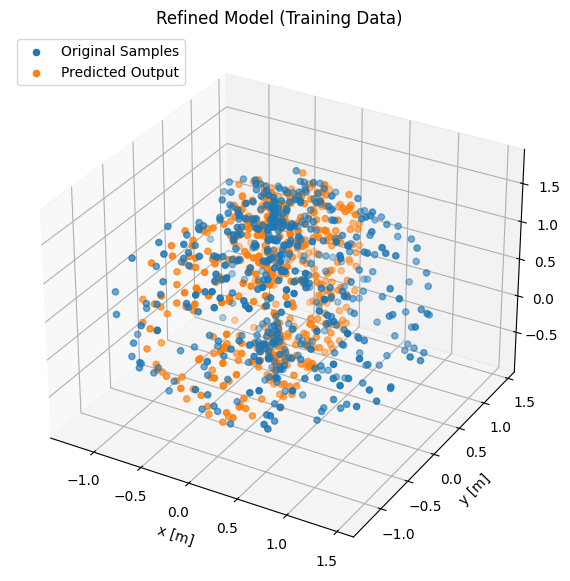

In [327]:
fig = plt.figure(figsize = (10, 7))
ax = plt.axes(projection ="3d")
 
## training output
ax.scatter3D(Y_orig_train[0:500, 0], Y_orig_train[0:500, 1], Y_orig_train[0:500, 2], 'ro', label='Original Samples')

## predicted output
ax.scatter3D(y_new1_train[0:500, 0], y_new1_train[0:500, 1], y_new1_train[0:500, 2], 'ko', label='Predicted Output')
plt.title('Refined Model (Training Data)')
plt.xlabel('x [m]')
plt.ylabel('y [m]')
plt.legend(loc="upper left")
    
plt.show()

In [328]:
import pickle 
    
with open('model_refined/y_new_first_layer.data', 'wb') as filehandle:
     # store the data as binary data stream
     pickle.dump(y_new1_train, filehandle)

### Error Calculation

In [329]:
#y_predict_train
#y_train
#y_new_train
#y_new3_train


row,col = y_train.shape

err_orig_in = np.zeros((1,4))
err_orig_out = np.zeros((1,4))
err_4_in = np.zeros((1,4))
err_4_out = np.zeros((1,4))
err_3_in = np.zeros((1,4))
err_3_out = np.zeros((1,4))
err_2_in = np.zeros((1,4))
err_2_out = np.zeros((1,4))
err_1_in = np.zeros((1,4))
err_1_out = np.zeros((1,4))


n_in = 0
n_out = 0


for i in range(row):
    if y_train[i,0]>0.5:
        err_orig_out = np.linalg.norm(Y_orig_train[i,0:3]-y_train[i,0:3]) + err_orig_out
        err_4_out = np.linalg.norm(y_new4_train[i,0:3]-y_train[i,0:3]) + err_4_out
        err_3_out = np.linalg.norm(y_new3_train[i,0:3]-y_train[i,0:3]) + err_3_out
        err_2_out = np.linalg.norm(y_new2_train[i,0:3]-y_train[i,0:3]) + err_2_out
        err_1_out = np.linalg.norm(y_new1_train[i,0:3]-y_train[i,0:3]) + err_1_out
        n_out += 1
    else:
        err_orig_in = np.linalg.norm(Y_orig_train[i,0:3]-y_train[i,0:3]) + err_orig_in
        err_4_in = np.linalg.norm(y_new4_train[i,0:3]-y_train[i,0:3]) + err_4_in
        err_3_in = np.linalg.norm(y_new3_train[i,0:3]-y_train[i,0:3]) + err_3_in
        err_2_in = np.linalg.norm(y_new2_train[i,0:3]-y_train[i,0:3]) + err_2_in
        err_1_in = np.linalg.norm(y_new1_train[i,0:3]-y_train[i,0:3]) + err_1_in
        n_in += 1
        
err_orig_in = err_orig_in/n_in 
err_4_in = err_4_in/n_in
err_3_in = err_3_in/n_in
err_2_in = err_2_in/n_in
err_1_in = err_1_in/n_in
err_orig_out = err_orig_out/n_out
err_4_out = err_4_out/n_out
err_3_out = err_3_out/n_out
err_2_out = err_2_out/n_out
err_1_out = err_1_out/n_out

err_orig_in = (err_orig_in[0,0]+err_orig_in[0,1]+err_orig_in[0,2])/3
err_4_in = (err_4_in[0,0]+err_4_in[0,1]+err_4_in[0,2])/3
err_3_in = (err_3_in[0,0]+err_3_in[0,1]+err_3_in[0,2])/3
err_2_in = (err_2_in[0,0]+err_2_in[0,1]+err_2_in[0,2])/3
err_1_in = (err_1_in[0,0]+err_1_in[0,1]+err_1_in[0,2])/3
err_orig_out = (err_orig_out[0,0]+err_orig_out[0,1]+err_orig_out[0,2])/3
err_4_out = (err_4_out[0,0]+err_4_out[0,1]+err_4_out[0,2])/3
err_3_out = (err_3_out[0,0]+err_3_out[0,1]+err_3_out[0,2])/3
err_2_out = (err_2_out[0,0]+err_2_out[0,1]+err_2_out[0,2])/3
err_1_out = (err_1_out[0,0]+err_1_out[0,1]+err_1_out[0,2])/3

stats_orig = np.array([[err_4_in/err_orig_in, err_3_in/err_orig_in, err_2_in/err_orig_in, err_1_in/err_orig_in],[err_4_out/err_orig_out, err_3_out/err_orig_out, err_2_out/err_orig_out, err_1_out/err_orig_out]])
print(stats_orig)

[[1.9553011  1.74926558 1.74026549 1.73998475]
 [7.44000083 6.97054392 6.94073851 6.93969828]]


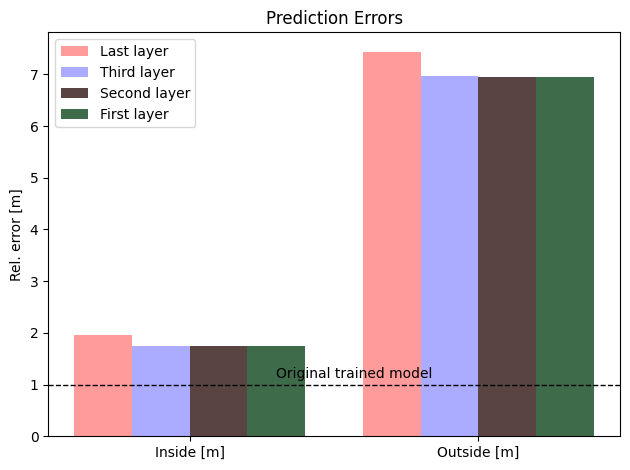

In [331]:
from matplotlib.pyplot import text
labels = ['Inside [m]', 'Outside [m]']
x = np.arange(len(labels))  # the label locations
width = 0.2  # the width of the bars



fig, ax = plt.subplots()
rects1 = ax.bar(x - 1.5*width, stats_orig[0:,0], width, color='#FF9B9B', label='Last layer')
rects2 = ax.bar(x - 0.5*width, stats_orig[0:,1], width, color='#ABABFF', label='Third layer')
rects3 = ax.bar(x + 0.5*width, stats_orig[0:,2], width, color='#5A4441', label='Second layer')
rects4 = ax.bar(x + 1.5*width, stats_orig[0:,3], width, color='#3E6B4A', label='First layer')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Rel. error [m]')
ax.set_title('Prediction Errors')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend(loc="upper left")

plt.axhline(y=1,linewidth=1, color='k',linestyle ="--")
text(0.3, 1.2, "Original trained model", verticalalignment='center')
fig.tight_layout()
plt.show()

## Store Model

In [332]:
model_orig.save('model1\my_model_1')

INFO:tensorflow:Assets written to: model1\my_model_1\assets


In [143]:
import pickle

with open('model1\loss.data', 'wb') as filehandle:
    # store the data as binary data stream
    pickle.dump(his.history['loss'], filehandle)

In [149]:
with open('model1/x_train.data', 'wb') as filehandle:
    # store the data as binary data stream
    pickle.dump(x_train, filehandle)
    
with open('model1/y_train.data', 'wb') as filehandle:
    # store the data as binary data stream
    pickle.dump(y_train, filehandle)
    
with open('model1/x_test.data', 'wb') as filehandle:
    # store the data as binary data stream
    pickle.dump(x_test, filehandle)
    
with open('model1/y_test.data', 'wb') as filehandle:
    # store the data as binary data stream
    pickle.dump(y_test, filehandle)